## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

## Import Packages

## Camera calibration using chessboard images

In [1]:
import numpy as np
import cv2
import glob
import math
import pickle
import os
import matplotlib
import matplotlib.pyplot as plt

In [2]:
def camera_calibration(nx, ny, cal_files):
    # nx - the number of insider corners in x
    # ny - the number of inside corners in y
    # cal_files: the location of the calibration images
    # cal_files = 'camera_cal/calibration*.jpg'

    # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros((nx*ny,3), np.float32)
    objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)

    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane.

    # Make a list of calibration images
    # images = glob.glob('./camera_cal/calibration*.jpg')
    images = glob.glob(cal_files)

    # Step through the list and search for chessboard corners
    for idx, fname in enumerate(images):
        img = cv2.imread(fname)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

        # If found, add object points, image points
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)
        else:
            print('Chessboard corners not found in image', fname)

    # Do camera calibration given object points and image points
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

    # return camera calibration matrix
    return mtx, dist

In [3]:
# Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
cal_files = './camera_cal/calibration*.jpg'
nx = 9  # the number of inside corners in x
ny = 6  # the number of inside corners in y
mtx, dist = camera_calibration(nx, ny, cal_files)
# Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
dist_pickle_file = open("./camera_cal/camera_calibration_pickle.p",'wb')
pickle.dump(dist_pickle, dist_pickle_file)

Chessboard corners not found in image ./camera_cal/calibration1.jpg
Chessboard corners not found in image ./camera_cal/calibration4.jpg
Chessboard corners not found in image ./camera_cal/calibration5.jpg


## Undistort 

In [4]:
def undistort(img, mtx, dist):
    # Image undistortion with camera calibration mtx and dist
    undist  = cv2.undistort(img, mtx, dist, None, mtx)
    return undist

In [5]:
def test_camera_calibration(filename,nx, ny, mtx,dist): 
    # test camera calibration with chessboard image
    image = cv2.imread(filename)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) 
    ret, corners = cv2.findChessboardCorners(gray,(nx,ny),None)
    image = cv2.drawChessboardCorners(image, (nx,ny), corners, ret)
    undist = undistort(image, mtx, dist)
    
    plt.figure(figsize=(20, 10))
    plt.subplot(1,2,1)
    plt.imshow(image)
    plt.title('Original chessboard', fontsize=25)
    plt.subplot(1,2,2)
    plt.imshow(undist)
    plt.title('Undistorted Chessboard', fontsize=25)
    plt.show()

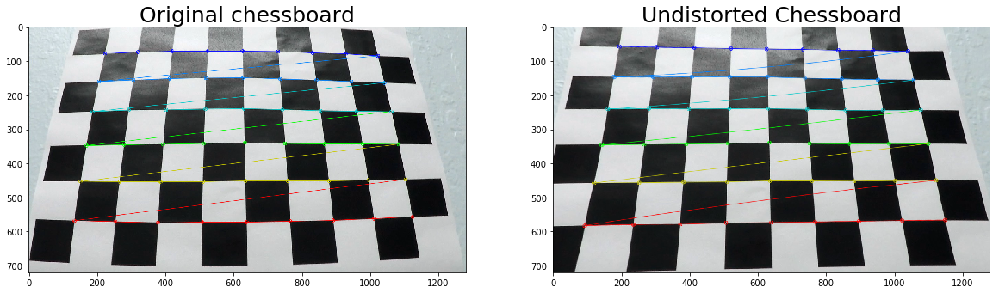

In [6]:
# Test camera calibration on sample chess board images
dist_pickle = pickle.load(open( "./camera_calibration_pickle.p", "rb" ))
mtx = dist_pickle["mtx"]
dist = dist_pickle["dist"]
cal_filename = './camera_cal/calibration3.jpg'
test_camera_calibration(cal_filename,nx, ny, mtx,dist)

## Perspective Transform

In [7]:
def warp(img, M_perp, flags=cv2.INTER_LINEAR):
    # Warp an image using a transform matrix.
    img_size = (img.shape[1], img.shape[0])
    return cv2.warpPerspective(img, M_perp, img_size, flags=cv2.INTER_LINEAR)

def perspective_transform(src, dst):
    # Compute perspective transform given source and destination points.
    M_perp = cv2.getPerspectiveTransform(src, dst)
    M_perp_inv = cv2.getPerspectiveTransform(dst, src)
    return M_perp, M_perp_inv

In [8]:
def test_undist_warp(img, nx, ny, mtx, dist):
    # undistort image using undistort()
    undist = undistort(img, mtx, dist)
    # Convert undistorted image to grayscale
    gray = cv2.cvtColor(undist, cv2.COLOR_BGR2GRAY)
    # Search for corners in the grayscaled image
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

    if ret == True:
        # If we found corners, draw them! (just for fun)
        cv2.drawChessboardCorners(undist, (nx, ny), corners, ret)
        # Choose offset from image corners to plot detected corners
        # This should be chosen to present the result at the proper aspect ratio
        # My choice of 100 pixels is not exact, but close enough for our purpose here
        offset = 100 # offset for dst points
        # Grab the image shape
        img_size = (gray.shape[1], gray.shape[0])

        # For source points I'm grabbing the outer four detected corners
        src = np.float32([corners[0], corners[nx-1], corners[-1], corners[-nx]])
        # For destination points, I'm arbitrarily choosing some points to be
        # a nice fit for displaying our warped result 
        # again, not exact, but close enough for our purposes
        dst = np.float32([[offset, offset], [img_size[0]-offset, offset], 
                                     [img_size[0]-offset, img_size[1]-offset], 
                                     [offset, img_size[1]-offset]])
        # Given src and dst points, calculate the perspective transform matrix
        M_per, M_per_inv = perspective_transform(src, dst)
        # Warp the image using warp()
        warped = warp(undist, M_per,img_size)

    # draw
    plt.figure(figsize=(20, 10))
    plt.subplot(1,2,1)
    plt.imshow(img)
    plt.title('Original chessboard', fontsize=25)
    plt.subplot(1,2,2)
    plt.imshow(warped)
    plt.title('Undistorted Warped Chessboard', fontsize=25)
    plt.show()

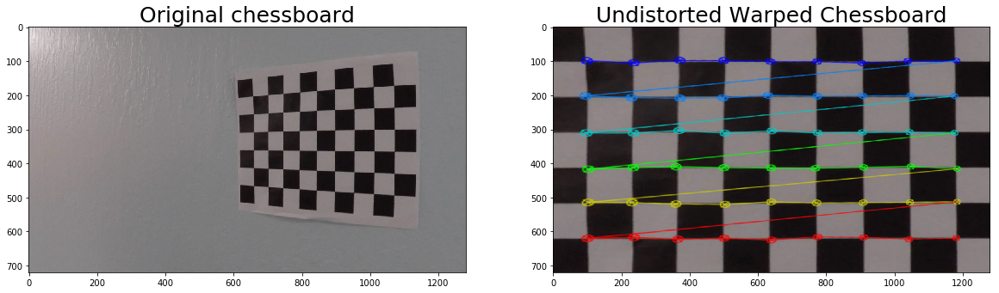

In [9]:
# Test undist and unwarp with sample chess board images
dist_pickle = pickle.load(open( "./camera_calibration_pickle.p", "rb" ))
mtx = dist_pickle["mtx"]
dist = dist_pickle["dist"]
cal_filename = './camera_cal/calibration12.jpg'
image = cv2.imread(cal_filename)
test_undist_warp(image,nx, ny, mtx,dist)

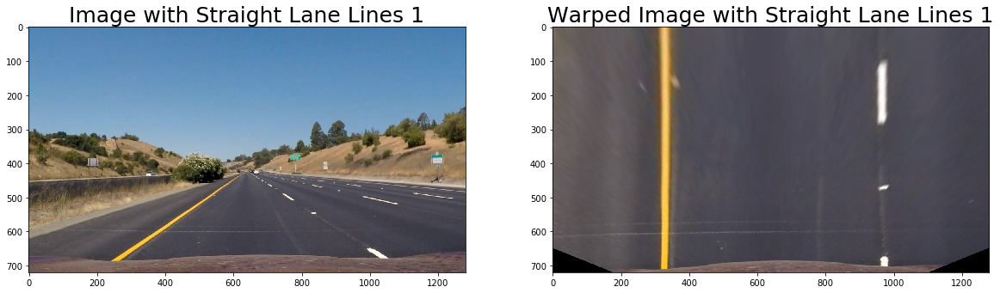

In [10]:
# Identiy source points for persepctive transform from a image where the lane lines are straight
# The assumption is that the road is a flat plane.
import matplotlib.image as mpimg
SourceImage = "test_images/straight_lines1.jpg"
image = mpimg.imread(SourceImage)
undist = undistort(image, mtx, dist)
#src1 = np.float32([[738,481],[1010,653],[295,653],[550,481]])
src1 = np.float32([[738,481],[1115,720],[196,720],[550,481]])
dst1 = np.float32([[980,0],[980,720],[320,720],[320,0]])
M_per, M_per_inv = perspective_transform(src1, dst1)
img_size = (image.shape[1],image.shape[0])
warped = warp(undist, M_per,img_size)

plt.figure(figsize=(20, 10))
plt.subplot(1,2,1)
plt.imshow(image)
plt.title('Image with Straight Lane Lines 1', fontsize=25)
plt.subplot(1,2,2)
plt.imshow(warped)
plt.title('Warped Image with Straight Lane Lines 1', fontsize=25)
plt.show()

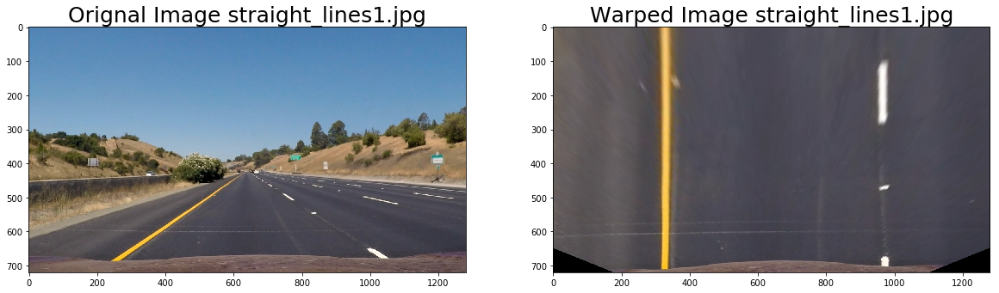

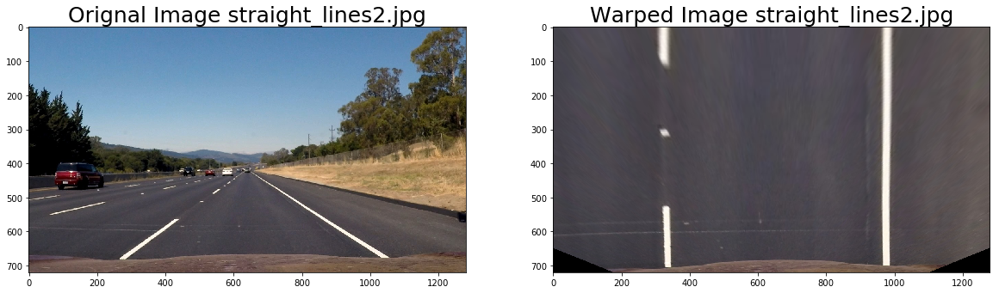

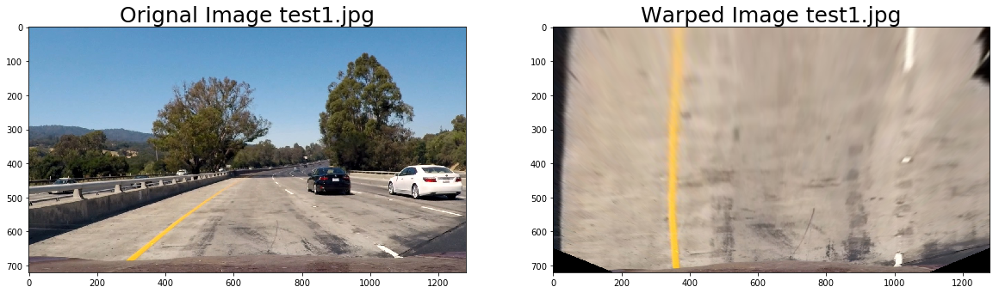

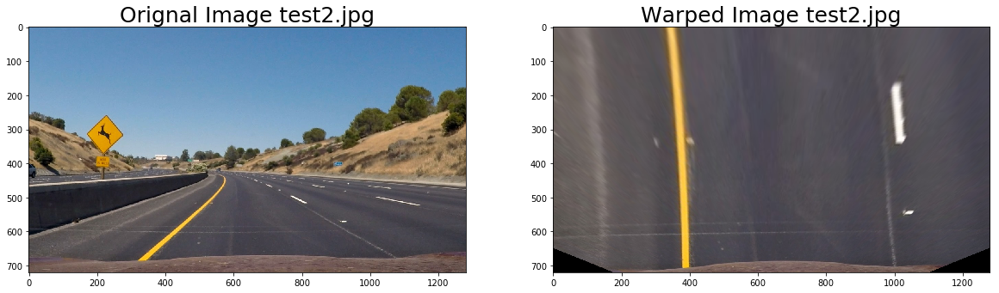

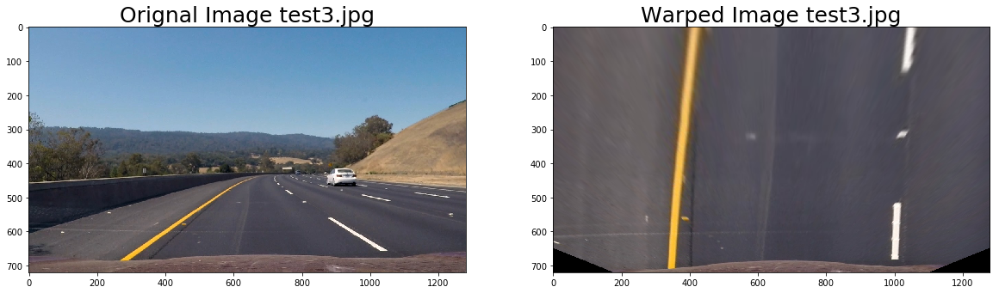

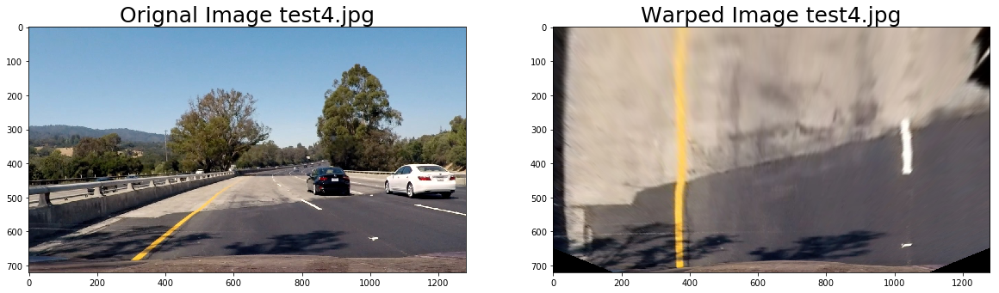

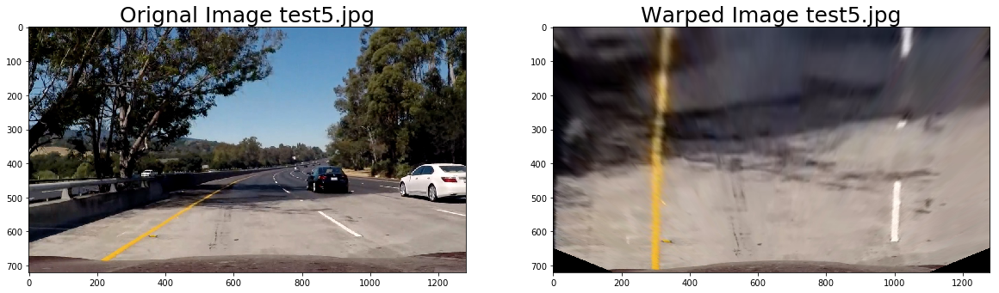

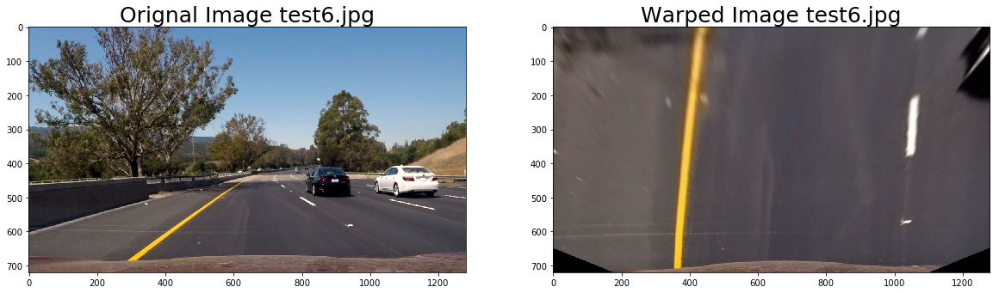

In [11]:
# test perspective on the other images in the test_images/ foler
testImagesDir = "test_images/"
filelist = os.listdir(testImagesDir)
for i in range(len(filelist)):
    filename  = filelist[i]
    image = mpimg.imread(testImagesDir + filename)
    undist = undistort(image, mtx, dist)
    warped = warp(undist, M_per,img_size)
    unwarped = warp(warped, M_per_inv,img_size)
    
    plt.figure(figsize=(20, 10))
    plt.subplot(1,2,1)
    plt.imshow(image)
    plt.title('Orignal Image '+ filename, fontsize=25)
    plt.subplot(1,2,2)
    plt.imshow(warped)
    plt.title('Warped Image '+ filename, fontsize=25)
    plt.show()   

## Gradient Thresholding

In [12]:
# Gaussian Smoothing
def gaussian_blur(img, kernel_size):
    """Applies a Gaussian Noise kernel"""
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    # Calculate directional gradient
    # Apply threshold
    
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
   
    # Gaussian smoothing
    gray = gaussian_blur(gray,3)
    
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    
    # Return the result
    return binary_output

def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Calculate gradient magnitude
    # Apply threshold
    
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Gaussian smoothing
    gray = gaussian_blur(gray,3)
    
    # Apply x or y gradient with the OpenCV Sobel() function
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1,  0, sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0,  1, sobel_kernel)
    # Calculate the magnitute of the gradient
    sobel_mag = np.sqrt(sobelx**2  + sobely**2)
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*sobel_mag/np.max(sobel_mag))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >=mag_thresh[0]) & (scaled_sobel <= mag_thresh[1])] = 1
    
    # Return the result
    return binary_output


def dir_thresh(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Calculate gradient direction
    # Apply threshold
    
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Gaussian smoothing
    gray = gaussian_blur(gray,3)
    
    # Apply x or y gradient with the OpenCV Sobel() function
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
     # Calculate the direction of the gradient
    sobel_dir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(sobel_dir)
    binary_output[(sobel_dir >= thresh[0]) & (sobel_dir <= thresh[1])] = 1
    
    # Return the result
    return binary_output

In [13]:
def test_abs_thresh(image, orient='x', thresh =(20,100)):    
    # Run the function
    grad_binary = abs_sobel_thresh(image, orient='x', thresh = thresh)
    # Plot the result
    print('Plot the gradient thresholding result:')
    plt.figure(figsize=(20, 10))
    plt.subplot(1,2,1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title('Orignal Image ', fontsize=25)
    plt.subplot(1,2,2)
    plt.imshow(grad_binary, cmap='gray')
    plt.title('Thresholded Gradient', fontsize=25)
    plt.show()   
      
    return grad_binary

In [14]:
def test_mag_thresh(image, sobel_kernel=3, mag_thresh=(30, 100)): 
    # Run the function
    mag_binary = mag_thresh(image, sobel_kernel=3, mag_thresh=mag_thresh)
    # Plot the result
    plt.figure(figsize=(20, 10))
    plt.subplot(1,2,1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title('Orignal Image ', fontsize=25)
    plt.subplot(1,2,2)
    plt.imshow(mag_binary, cmap='gray')
    plt.title('Thresholded Magnitude', fontsize=25)
    plt.show()   
    return grad_binary

In [15]:
def test_dir_thresh(image, sobel_kernel=15, thresh=(0.7, 1.3)): 
    # Run the function
    dir_binary = dir_threshold(image, sobel_kernel=15, thresh=thresh)
     
    # Plot the result
    plt.figure(figsize=(20, 10))
    plt.subplot(1,2,1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title('Orignal Image ', fontsize=25)
    plt.subplot(1,2,2)
    plt.imshow(dir_binary, cmap='gray')
    plt.title('Thresholded Grad. Dir.', fontsize=25)
    plt.show()   
    return grad_binary

## Color Thresholding

In [16]:
# Define a function that thresholds the S-channel of HLS
def hls_select(img, thresh=(0, 255)):
    # Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    S = hls[:,:,2]
    # Apply a threshold to the S channel
    binary_output = np.zeros_like(S)
    # Return a binary image of threshold result
    binary_output[(S > thresh[0]) & (S <= thresh[1])] = 1
    return binary_output, hls

In [17]:
# test color thresholding on S channel
def test_hls_select(img, thresh=(100, 255)):
    hls_binary, hls = hls_select(img, thresh=thresh)
    # plot the H, L, S channels
    print('Plot the H, L, S channels:')
    plt.figure(figsize=(24, 9))
    plt.subplot(1,3,1)
    plt.imshow(hls[:, : , 0], cmap='gray')
    plt.title('H', fontsize=25)
    plt.subplot(1,3,2)
    plt.imshow(hls[:, : , 1], cmap='gray')
    plt.title('L', fontsize=25)
    plt.subplot(1,3,3)
    plt.imshow(hls[:, : , 2], cmap='gray')
    plt.title('S', fontsize=25)
    plt.show()   
     
    # Plot the thresholded result
    print('Plot the HLS thresholded result:')
    plt.figure(figsize=(20, 10))
    plt.subplot(1,2,1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Orignal Image ', fontsize=25)
    plt.subplot(1,2,2)
    plt.imshow(hls_binary, cmap='gray')
    plt.title('Thresholded S', fontsize=25)
    plt.show()    
   
    return hls_binary, hls
    

Test undist, gradient thresholding, color thresholding, and perspective transform
The test image is test3.jpg
...
Plot the H, L, S channels:


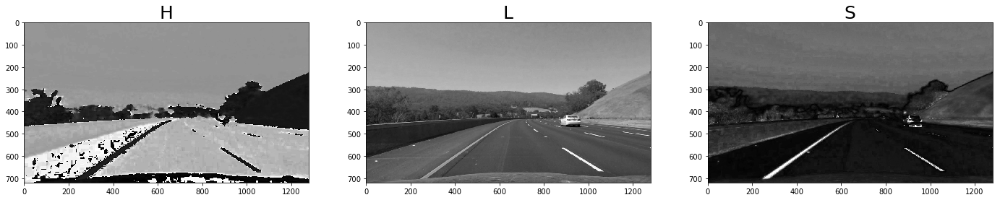

Plot the HLS thresholded result:


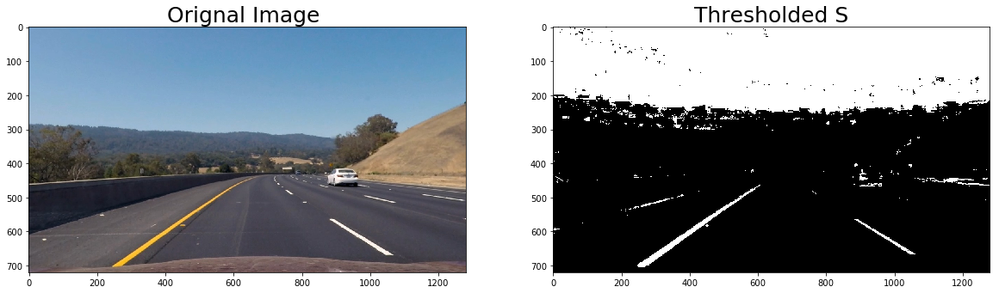

Plot the gradient thresholding result:


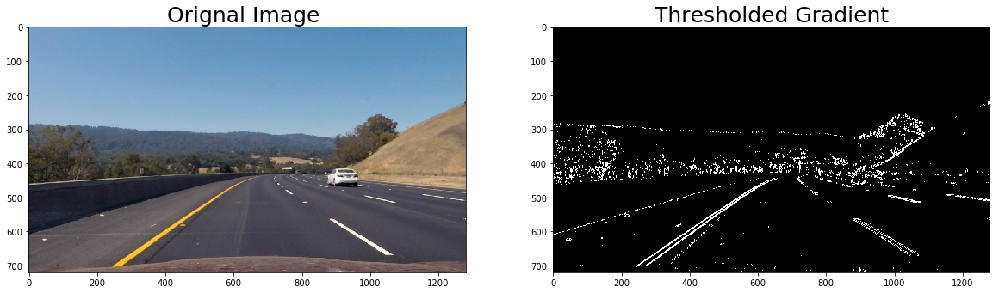

...
Plot the original image, the undistot image, the s thresholded and the s_x_thresholded...


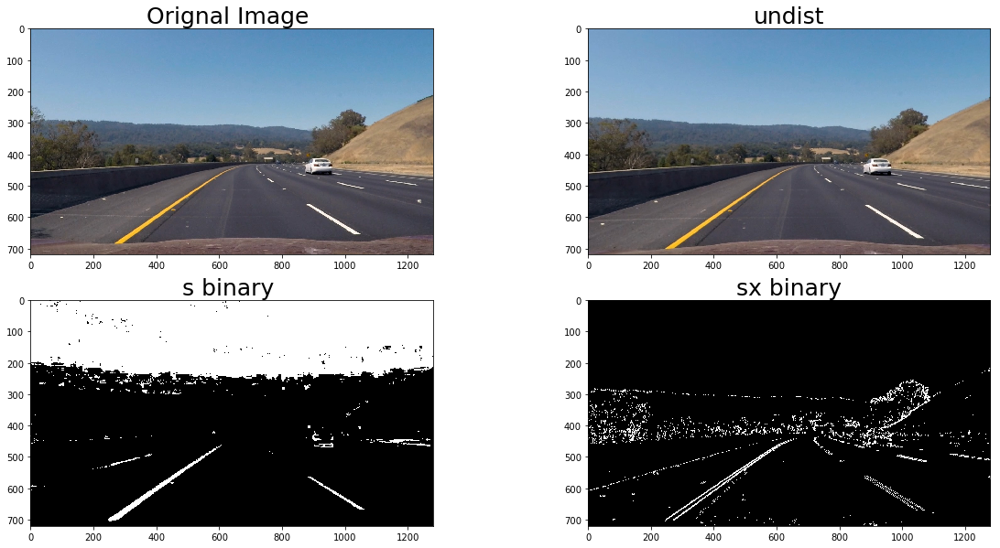

...
Plot stacked thresholds, the combined binary from s and s_x, and the warped image...


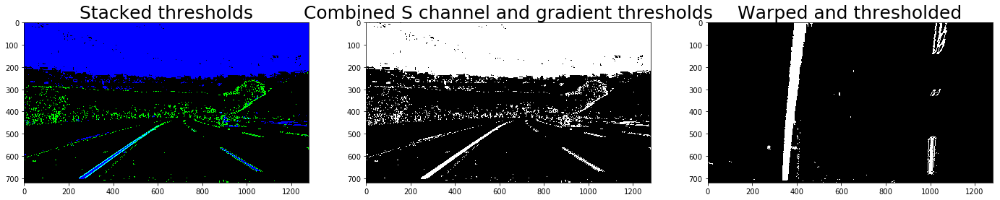

In [18]:
# Test undist, gradient and color thresholding. and warp
test_flag = True
if test_flag:
    testImagesDir = "test_images/"
    filelist = os.listdir(testImagesDir)
    i = 4
    filename  = filelist[i]
    img = cv2.imread(testImagesDir + filename)
    undist = undistort(img, mtx, dist)  
    
    # test the hls thresholding
    print('Test undist, gradient thresholding, color thresholding, and perspective transform')
    print('The test image is ' + filename)
    print('...')
    s_binary, hls = test_hls_select(undist, thresh=(100, 255))
    
    # test the gradient x thresholding
    sxbinary = test_abs_thresh(undist, orient='x', thresh =(20,100))    
   
    # plot original, undist, s thresholding and s_x_thresholding
    print('...')
    print('Plot the original image, the undistot image, the s thresholded and the s_x_thresholded...')
    plt.figure(figsize=(20, 10))
    plt.subplot(2,2,1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Orignal Image ', fontsize=25)
    plt.subplot(2,2,2)
    plt.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
    plt.title('undist', fontsize=25)
    plt.subplot(2,2,3)
    plt.imshow(s_binary, cmap='gray')
    plt.title('s binary ', fontsize=25)
    plt.subplot(2,2,4)
    plt.imshow(sxbinary, cmap='gray')
    plt.title('sx binary', fontsize=25)
    plt.show()   
    
    # color binary, R G B
    color_binary = np.dstack((np.zeros_like(sxbinary), sxbinary, s_binary)) * 255
    
    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1
    # warped 
    warped = warp(combined_binary, M_per,img_size)
    print('...')
    print('Plot stacked thresholds, the combined binary from s and s_x, and the warped image...')
     
    plt.figure(figsize=(24, 12))
    plt.subplot(1,3,1)
    plt.imshow(color_binary)
    plt.title('Stacked thresholds', fontsize=25)
    plt.subplot(1,3,2)
    plt.imshow(combined_binary, cmap='gray')
    plt.title('Combined S channel and gradient thresholds', fontsize=25)
    plt.subplot(1,3,3)
    plt.imshow(warped, cmap='gray')
    plt.title('Warped and thresholded', fontsize=25)
    plt.show()   

In [19]:
# Define conversions in x and y from pixels space to meters
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension

def find_lines(binary_warped, nwindows= 9, margin = 100, minpix = 50):
    # Assuming you have created a warped binary image called "binary_warped"
    # nwindows = 9, the number of sliding windows
    # margin = 100,the width of the windows +/- margin
    # minpix = 50, minimum number of pixels found to recenter window
   
    # Take a histogram of the bottom half of the image       
    histogram = np.sum(binary_warped[np.int(binary_warped.shape[0]/2):,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    off1 = 85
    off2 = 225
    leftx_base = np.argmax(histogram[off1+1:midpoint]) + off1
    rightx_base = np.argmax(histogram[midpoint:histogram.shape[0]-off2]) + midpoint

   
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
  
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
        (0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
        (0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 
    
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    # Fit a second order polynomial to each
   
    left_fit = line_polyfit(lefty, leftx)
    right_fit = line_polyfit(righty,rightx)
    
    # line for drawing
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    #poly fit 
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    return left_fit, right_fit, out_img, ploty, left_fitx, right_fitx

In [20]:
def line_polyfit(x,y):
    # line fit with np.polyfit
    fit = np.polyfit(x, y, 2)
    return fit 


In [21]:
def line_curvature(line_fit, y_eval):
    #Compute the curvature from the line fitting coefficients
    if line_fit[0] != 0.:
        curvature = ((1 + (2*line_fit[0]*y_eval + line_fit[1])**2)**1.5) / np.absolute(2*line_fit[0])
    else:
        curvature = np.inf
    return curvature

In [22]:
def line_base_pos(line_fit, y_eval):
    return (line_fit[0] *(y_eval**2) + line_fit[1] *y_eval + line_fit[2])

In [23]:
def draw_line_on_image(warped, ploty, left_fitx, right_fitx, undist, Minv):
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB), 1, newwarp, 0.3, 0)
    
    result_videoframe = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    
    # plt.imshow(result)
    return result, result_videoframe

In [24]:
def draw_line_curv_on_image(warped, ploty, left_fitx, right_fitx, undist, Minv,curv,offset):
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB), 1, newwarp, 0.3, 0)
    
    result_videoframe = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    
    curv_txt =   'Curvature: {0:.0f}m'.format(curv)   
    offset_txt = 'Offset   : {0:.2f}m'.format(offset)     
    font = cv2.FONT_HERSHEY_SIMPLEX   
    
    cv2.putText(result, curv_txt, (80, 80), font, 1.2, (255, 255, 255), 2, cv2.LINE_AA) 
    cv2.putText(result, offset_txt, (80, 120), font, 1.2,  (255, 255, 255), 2, cv2.LINE_AA)     
    
    cv2.putText(result_videoframe, curv_txt, (80, 80), font, 1.2, (255, 255, 255), 2, cv2.LINE_AA) 
    cv2.putText(result_videoframe, offset_txt, (80, 120), font, 1.2,  (255, 255, 255), 2, cv2.LINE_AA)     
    # plt.imshow(result)
    return result, result_videoframe

## Pipeline

In [25]:
def pipeline(img, s_thresh=(170, 255), sx_thresh=(20, 100),M = M_per, Minv = M_per_inv):
    img = np.copy(img)
    # undistort using camera calibration matrix and distortion coefficients
    undist = undistort(img, mtx, dist)
    
    # Gradient Thresholding on x to detect nearly vertical lines
    sxbinary = abs_sobel_thresh(img, orient='x', thresh = sx_thresh)
       
    # Color Thresholding on s channel 
    s_binary, hls = hls_select(img, thresh=s_thresh)
     
    # Stack each channel
    # Note color_binary[:, :, 0] is all 0s, effectively an all black image. It might
    # be beneficial to replace this channel with something else.
    color_binary = np.dstack((np.zeros_like(sxbinary), sxbinary, s_binary)) * 255
    
    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1

    # Perspective Transform
    img_size = (image.shape[1],image.shape[0])
    
    binary_warped = warp(combined_binary, M,img_size)
    
    # poly fit for pixels
    left_fit, right_fit, img_out, ploty, left_fitx, right_fitx = find_lines(binary_warped, nwindows= 9, margin = 100, minpix = 50)      
    # Define a class to receive the characteristics of each line detection to track the lane lines
   

    # poly fit in meters    
    y_max = image.shape[0] # the size of the image, y 
    x_max = image.shape[1] # the size of the image, x
    
    xm_center_position = x_max * xm_per_pix / 2 # the center position in meters
    
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    
    # Calculate the radii of curvature, in meters
    left_curv = line_curvature(left_fit_cr, y_eval = y_max*ym_per_pix )
    right_curv  =  line_curvature(right_fit_cr, y_eval = y_max*ym_per_pix )
    curv = (left_curv + right_curv)/2
    # base position for left and right lines,in meters
    left_base = line_base_pos(left_fit_cr, y_max*ym_per_pix)
    right_base = line_base_pos(right_fit_cr, y_max*ym_per_pix)
    # off set from the center of the lane, in meters
    offset = np.abs(xm_center_position - (left_base + right_base)/2)
    
    
    result, result_frame = draw_line_curv_on_image(warped, ploty, left_fitx, right_fitx, undist, Minv,curv,offset)
    
    return binary_warped,left_fit,right_fit, img_out, ploty, left_fitx, right_fitx, result, result_frame 
    
    

In [26]:
def test_pipeline(img, filename, s_thresh=(165, 255), sx_thresh=(18, 100)):
    # img:  BGR image
    binary_warped, left_fit,right_fit, img_out, ploty, left_fitx, right_fitx, result, result_frame = pipeline(img, s_thresh=s_thresh, sx_thresh=sx_thresh)
    # Plot the result
    print('Plot the pipe line result:')
    plt.figure(figsize=(20, 16))
    plt.subplot(1,2,1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Orignal, Image ' + filename, fontsize=25)
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    plt.subplot(1,2,2)
    plt.imshow(binary_warped, cmap='gray')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    plt.title('binary_warped, Image ' + filename, fontsize=25)
    plt.show()   
     
    
    plt.figure(figsize=(20, 16))
    plt.subplot(1,2,1)
    plt.imshow(img_out)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    plt.title('Line Fit, Image ' + filename, fontsize=25)
    plt.subplot(1,2,2)
    plt.imshow(result)
    plt.title('pipeline result, Image ' + filename, fontsize=25)
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    plt.show()
    return binary_warped

Plot the pipe line result:


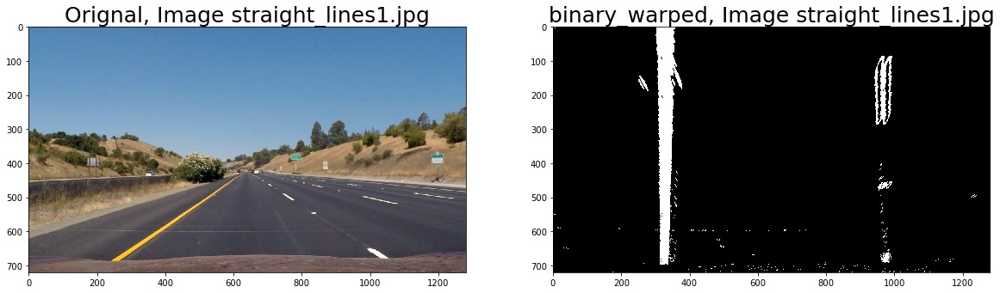

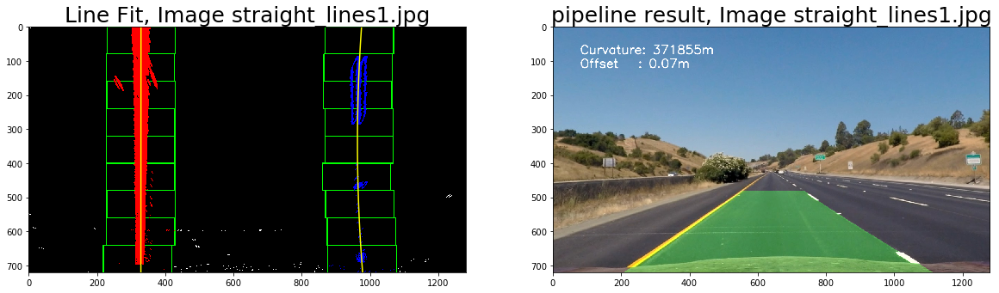

Plot the pipe line result:


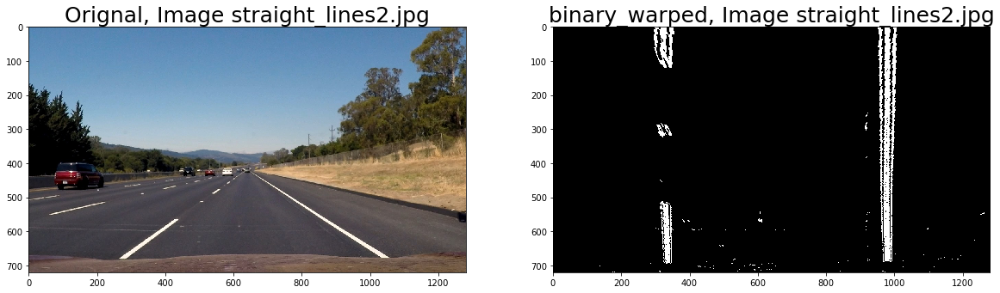

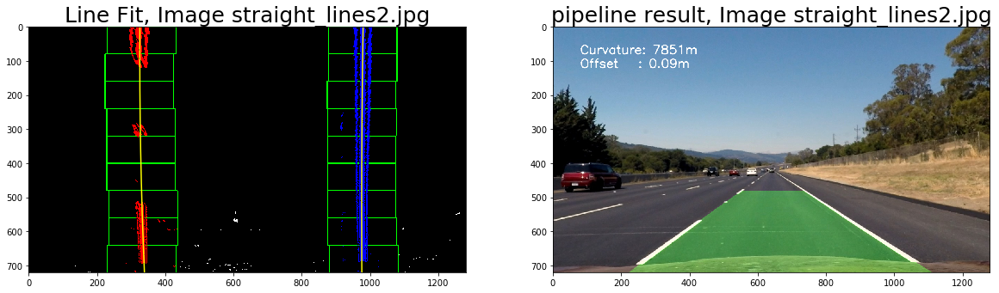

Plot the pipe line result:


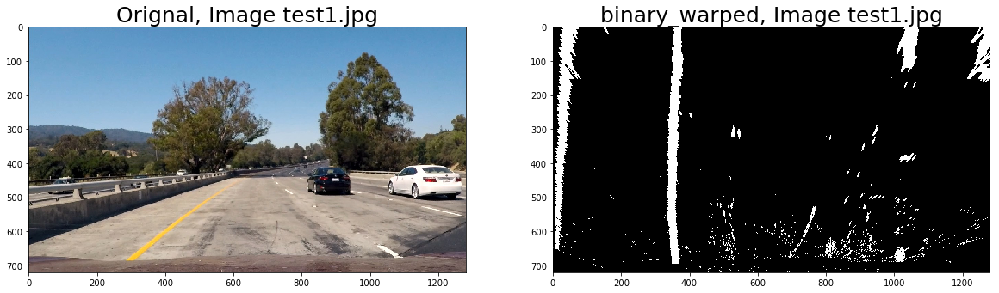

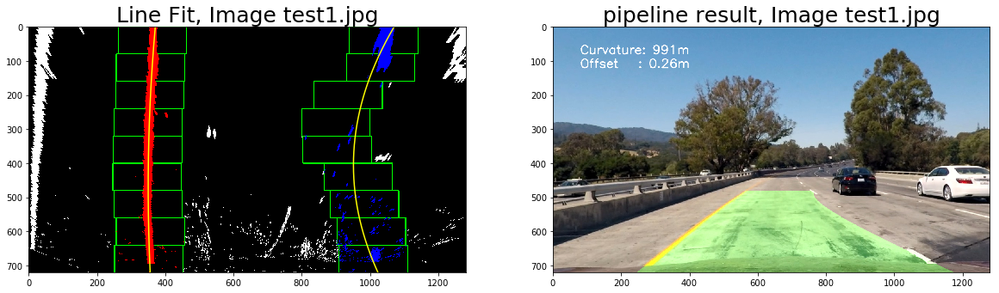

Plot the pipe line result:


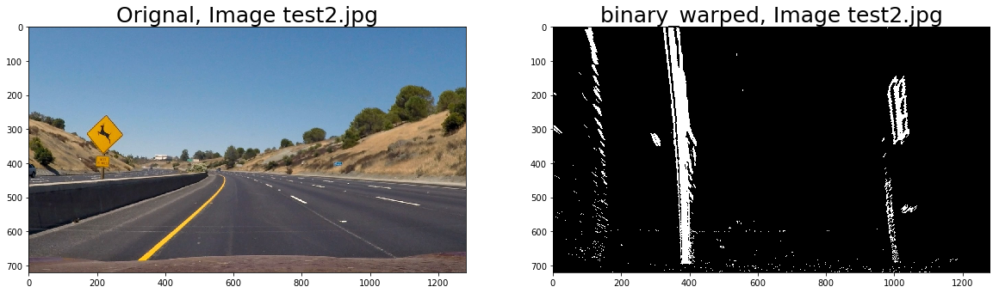

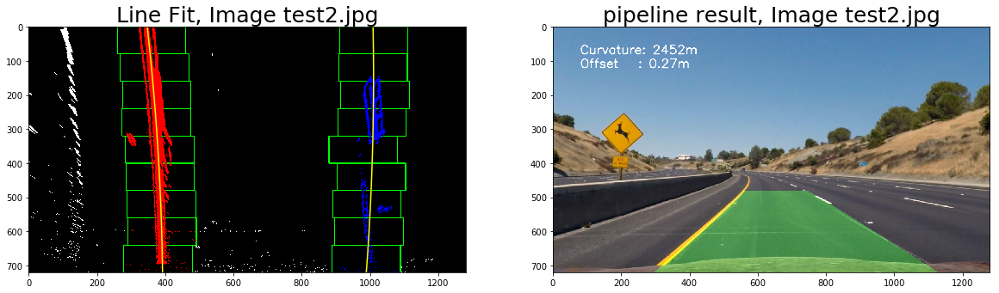

Plot the pipe line result:


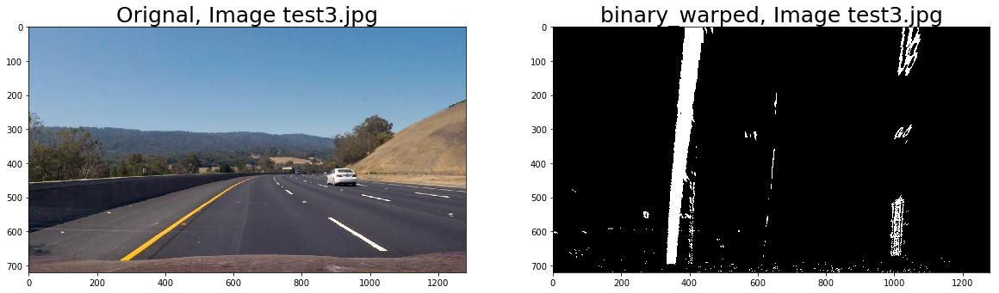

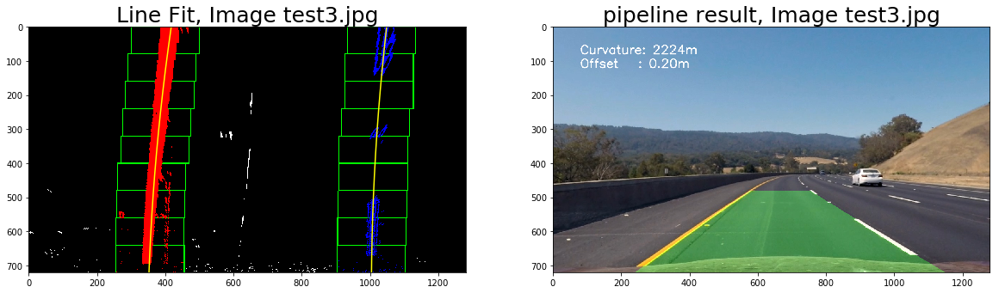

Plot the pipe line result:


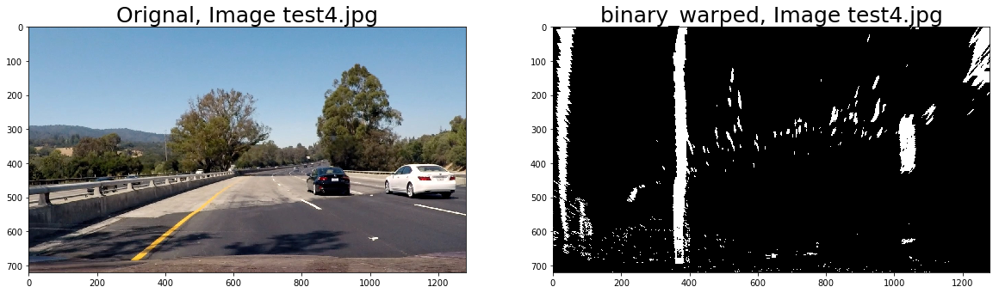

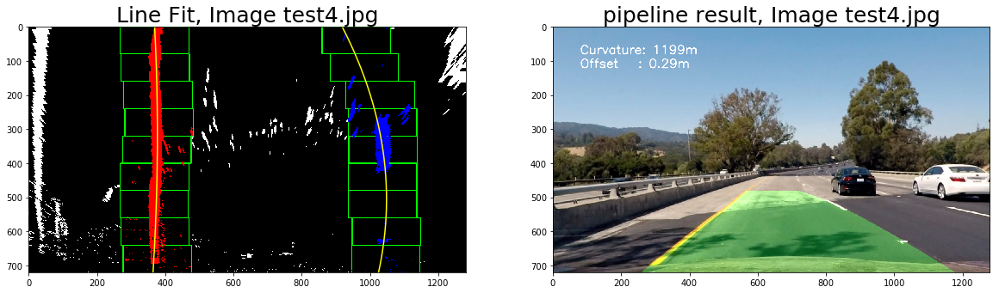

Plot the pipe line result:


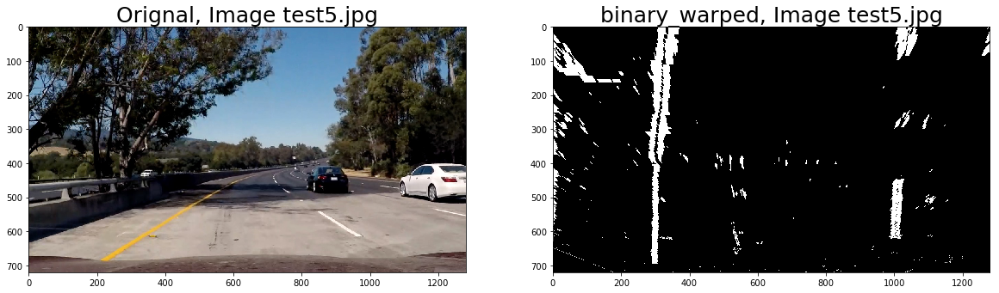

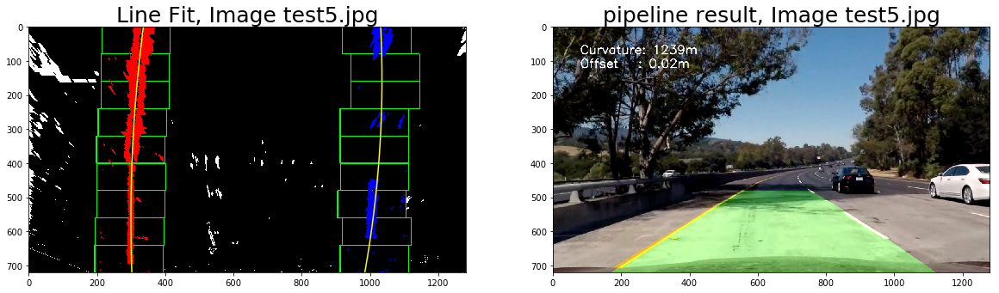

Plot the pipe line result:


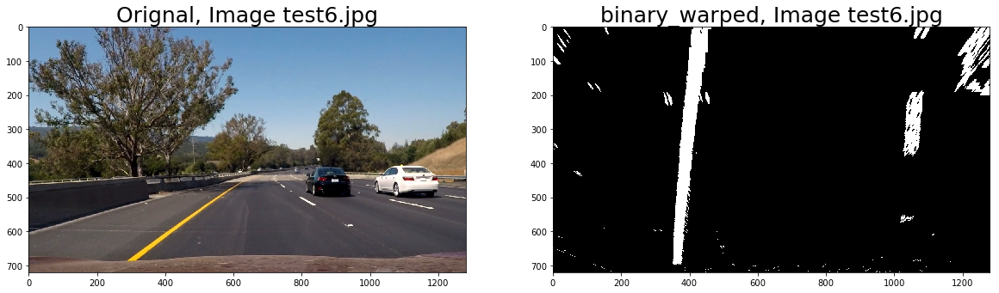

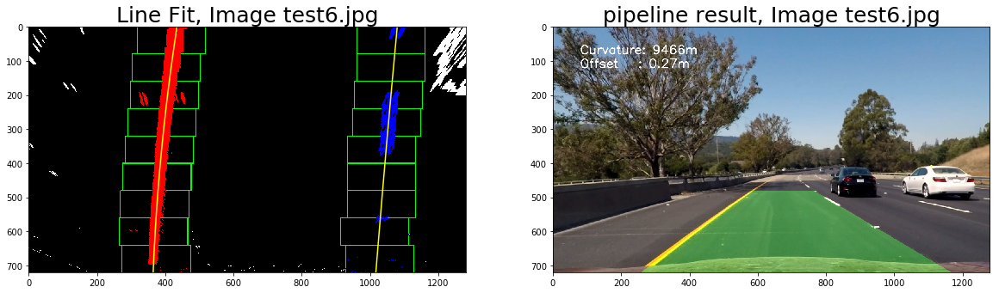

In [27]:
## First, test on one image see how the pipe line works
test_pipeline_flag = True
if test_pipeline_flag: 
    testImagesDir = "test_images/"
    filelist = os.listdir(testImagesDir)
    for i in range(len(filelist)):
        filename  = filelist[i]
        img = cv2.imread(testImagesDir + filename)
        pipeline_binary = test_pipeline(img,filename, s_thresh=(165, 255), sx_thresh=(15, 100))      

In [39]:
# Define a class to receive the characteristics of each line detection to track the lane lines
# Define conversions in x and y from pixels space to meters
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension
y_max = 720 # the size of the image, y 
x_max = 1280 # the size of the image, x
xm_center_position = x_max * xm_per_pix / 2 # the center position in meters

N_fits = 10  #  The number of last N_fits for detection

# Parameters to decide line detection result
# the limit of line fitting error from residues output of numpy.polyfit
fit_err_limit = 80  # to be adjusted
# the limit of the difference between the current fit and the last fit coefficients
fit_diff_limit = 1000 # to be adjusted
# the limit of the difference between the the current base position fitx and the best fitx
fit_diffx_limit = 50

## Define a class that represents one lane line 
class LaneLine():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        #polynomial coefficients for the most recent fit
        self.fit = None    
        #polynomial fit error based on residues from numpy.polyfit
        self.fit_err = None 
        #radius of curvature of the line in some units
        self.radius_of_curvature = None        
        #line base position in meters
        self.line_base_pos = None           
                        
        # The number of iterations to get the the moving average  
        self.recent_N =  N_fits         
        #polynomial coefficients of the last n iterations
        self.recent_fits = []  
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None                  
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float')                                
       
        #x values for detected line pixels
        # self.allx = None  
        #y values for detected line pixels
        # self.ally = None
        #average x values of the fitted line over the last n iterations
        self.best_fitx = None  
         # x values of the last n fits of the line
        self.recent_xfitted = [] 
        
    def set_radius_base(self, fit = None):
        # keep only recent N fits
        if fit is None:
            fit = self.best_fit    
        self.radius_of_curvature = ((1 + (2*fit[0]*y_max*ym_per_pix  + fit[1])**2)**1.5) / np.absolute(2*fit[0])
        self.line_base_pos = (fit[0] *(y_max*ym_per_pix**2) + fit[1] *y_max*ym_per_pix + fit[2]) 
    
    def fit_laneline(self,fitx, fity):
        #fix, fity, the x and y coordinates for the current line
        self.detected = True
        fit, residues,_,_,_ = np.polyfit(fity*ym_per_pix,fitx*xm_per_pix ,2,full=True)
        self.fit_err =  residues/len(fitx)
       
        # fit error based on residues
        # if self.fit_err > fit_err_limit:
        #    self.detected = False            
              
        # the difference between the fitx and the best_fitx
        if self.best_fitx is not None:
            if np.linalg.norm(fitx[-1] - self.best_fitx[-1]) > fit_diffx_limit:
                self.detected = False                   
      
        if self.detected is False:
            return                  
                  
        # the difference between the current fit and the last fit 
        if self.fit is not None:
            self.diffs = fit - self.fit
        
        # set the most recent fit
        self.fit = fit        
        
        # set the curvature and the line base position
        self.set_radius_base(self.fit)        
        # Set the history of line fitting
        self.recent_fits.append(self.fit)
        if len(self.recent_fits) >= self.recent_N:
            self.recent_fits.pop(0)
        self.best_fit = np.mean(np.array(self.recent_fits), axis=0)
        self.recent_xfitted.append(fitx)
        if len(self.recent_xfitted)>self.recent_N:
            self.recent_xfitted.pop(0)
        self.best_fitx = np.mean(np.array(self.recent_xfitted), axis=0)                                                 
           

In [40]:
def check_linefit_diff(diffs): 
    # check the difference between the current fit and the last fit
    return diffs > fit_diff_limit

In [41]:
def check_mean_curvature(left_curvature, right_curvature, expected_curvature = 1000):
    # expected_curvature = 1000 meters
    fit_mean_curvature = np.absolute((np.array(curvature) + np.array(curvature))/2)
    # check whether the curvature is at the same magnitude of the real curvature
    return fit_mean_curvature/expected_curvature >= 5 or fit_mean_curvature/expected_curvature <= 0.2   
    

In [42]:
def check_curvature_diff(left_curvature, right_curvature, expected_curvature = 1000):
    # expected_curvature = 1000 meters
    fit_diff_curvature = np.absolute(np.array(left_curvature) - np.array(right_curvature))
    fit_mean_curvature = np.absolute((np.array(left_curvature) + np.array(right_curvature))/2)
    # check the difference between the left and right curvature 
    return fit_diff_curvature/fit_mean_curvature >= 1/2 

In [43]:
def check_offset_diff(left_line_base_pos, right_line_base_pos):
    left_offset = xm_center_position - left_line_base_pos 
    right_offset = right_line_base_pos - xm_center_position
    # check the difference between the left and the right offset
    return np.absolute(left_offset-right_offset) > 1/2 # meters    

In [44]:
def check_lane_width(left_line_base_pos, right_line_base_pos):
    lane_width = left_line_base_pos - right_line_base_pos
    min_lane_width = 3   # meters
    max_lane_width = 4   # meters
    # Compare the distance between the two lines with the width of the lane 
    return (lane_width > min_lane_width  and lane_width < max_lane_width)

In [45]:
left_line = LaneLine()
right_line = LaneLine()

In [46]:
def pipeline_track(img, s_thresh=(170, 255), sx_thresh=(20, 100),M = M_per, Minv = M_per_inv):
    img = np.copy(img)
    # undistort using camera calibration matrix and distortion coefficients
    undist = undistort(img, mtx, dist)
    
    # Gradient Thresholding on x to detect nearly vertical lines
    sxbinary = abs_sobel_thresh(img, orient='x', thresh = sx_thresh)
       
    # Color Thresholding on s channel 
    s_binary, hls = hls_select(img, thresh=s_thresh)
     
    # Stack each channel
    # Note color_binary[:, :, 0] is all 0s, effectively an all black image. It might
    # be beneficial to replace this channel with something else.
    color_binary = np.dstack((np.zeros_like(sxbinary), sxbinary, s_binary)) * 255
    
    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1

    # Perspective Transform
    img_size = (image.shape[1],image.shape[0])
    binary_warped = warp(combined_binary, M,img_size)
    
    # get ploty, left_fitx, right_fitx in pixel values
    left_fit, right_fit, img_out, ploty, left_fitx, right_fitx = find_lines(binary_warped, nwindows= 9, margin = 100, minpix = 50)      
    
    # poly fit with continous frame withe the laneline class
    left_line.fit_laneline(left_fitx, ploty)
    right_line.fit_laneline(right_fitx, ploty)
    
     # the quality of the lane lines 
    left_line_detected = left_line.detected
    right_line_detected = right_line.detected
    if left_line.detected:
        diffs = np.linalg.norm(left_line.diffs)
        if check_linefit_diff(diffs):
            left_line_detected = False 
        else:           
            left_curv = left_line.radius_of_curvature
            left_base = left_line.line_base_pos         
            
    if right_line.detected:
        diffs = np.linalg.norm(right_line.diffs)
        if check_linefit_diff(diffs):
            right_line_detected = False                  
        else:
            right_curv = right_line.radius_of_curvature
            right_base = right_line.line_base_pos         
            
    if left_line_detected and right_line_detected:
        curv_diff = check_curvature_diff(left_curv, right_curv)
        offset_diff = check_offset_diff(left_base, right_base)
        line_width = check_lane_width(left_base, right_base)
        if curv_diff or offset_diff or line_width:
            left_line_detected = False
            right_line_detected = False  
    
    if not left_line_detected:
        left_fit = left_line.best_fit
        left_fitx = left_line.best_fitx
        left_line.set_radius_base(left_fit)
        left_curv = left_line.radius_of_curvature    
        left_base = left_line.line_base_pos  
    if not right_line_detected: 
        right_fit = right_line.best_fit
        right_fitx = right_line.best_fitx
        right_line.set_radius_base(right_fit) 
        right_curv = right_line.radius_of_curvature    
        right_base = right_line.line_base_pos    
       
    curv = (left_curv + right_curv)/2
    offset = np.abs(xm_center_position - (left_base + right_base)/2)
    result, result_frame = draw_line_curv_on_image(warped, ploty, left_fitx, right_fitx, undist, Minv,curv,offset)
    
    return binary_warped,left_fit,right_fit, img_out, ploty, left_fitx, right_fitx, result, result_frame 
    
    

In [47]:
# Track the lane lines in continous frames
def process_image_tracking(image):
    binary_warped,left_fit,right_fit, img_out, ploty, left_fitx, right_fitx, result, result_video_frame  = pipeline_track(image, s_thresh=(170, 255), sx_thresh=(20, 100),M = M_per, Minv = M_per_inv)
    return result_video_frame

In [48]:
# save the results for each frame to examine
cnt=0
def process_image_saveframe(image):
    global cnt
    binary_warped,left_fit,right_fit, img_out, ploty, left_fitx, right_fitx, result, result_video_frame  = pipeline_track(image, s_thresh=(170, 255), sx_thresh=(20, 100),M = M_per, Minv = M_per_inv)   
    mpimg.imsave('test_video_frames/test_output_'+str(cnt).strip()+'.jpg', result_video_frame, format='jpg')
    cnt+=1
    print(str(cnt))
    return result_video_frame


In [50]:
import imageio
imageio.plugins.ffmpeg.download()
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [51]:
# Test on videos with full pipe line with tracking, saving each frame for investigation
# test_output = './project_video_output.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
#clip1 = VideoFileClip("project_video.mp4").subclip(0,5)
# clip = VideoFileClip("project_video.mp4")
# clip_output = clip.fl_image(process_image_saveframe) #NOTE: this function expects color images!!
# %time clip_output.write_videofile(test_output, audio=False)

1
[MoviePy] >>>> Building video ./project_video_output.mp4
[MoviePy] Writing video ./project_video_output.mp4


  0%|          | 1/1261 [00:00<02:53,  7.27it/s]

2


  0%|          | 2/1261 [00:00<02:58,  7.04it/s]

3


  0%|          | 3/1261 [00:00<03:00,  6.99it/s]

4


  0%|          | 4/1261 [00:00<03:05,  6.76it/s]

5


  0%|          | 5/1261 [00:00<03:08,  6.66it/s]

6


  0%|          | 6/1261 [00:00<03:06,  6.73it/s]

7


  1%|          | 7/1261 [00:01<03:09,  6.63it/s]

8


  1%|          | 8/1261 [00:01<03:15,  6.41it/s]

9


  1%|          | 9/1261 [00:01<03:25,  6.10it/s]

10


  1%|          | 10/1261 [00:01<03:26,  6.06it/s]

11


  1%|          | 11/1261 [00:01<03:32,  5.89it/s]

12


  1%|          | 12/1261 [00:01<03:33,  5.85it/s]

13


  1%|          | 13/1261 [00:02<03:37,  5.74it/s]

14


  1%|          | 14/1261 [00:02<03:39,  5.69it/s]

15


  1%|          | 15/1261 [00:02<03:29,  5.95it/s]

16


  1%|▏         | 16/1261 [00:02<03:21,  6.18it/s]

17


  1%|▏         | 17/1261 [00:02<03:20,  6.20it/s]

18


  1%|▏         | 18/1261 [00:02<03:19,  6.22it/s]

19
20


  2%|▏         | 20/1261 [00:03<03:31,  5.87it/s]

21


  2%|▏         | 21/1261 [00:03<03:25,  6.03it/s]

22


  2%|▏         | 22/1261 [00:03<03:26,  5.99it/s]

23


  2%|▏         | 23/1261 [00:03<03:21,  6.16it/s]

24


  2%|▏         | 24/1261 [00:03<03:16,  6.29it/s]

25


  2%|▏         | 25/1261 [00:04<03:20,  6.15it/s]

26


  2%|▏         | 26/1261 [00:04<03:29,  5.90it/s]

27


  2%|▏         | 27/1261 [00:04<03:36,  5.70it/s]

28


  2%|▏         | 28/1261 [00:04<03:34,  5.75it/s]

29


  2%|▏         | 29/1261 [00:04<03:35,  5.71it/s]

30


  2%|▏         | 30/1261 [00:04<03:33,  5.76it/s]

31


  2%|▏         | 31/1261 [00:05<03:33,  5.76it/s]

32


  3%|▎         | 32/1261 [00:05<03:24,  6.01it/s]

33


  3%|▎         | 33/1261 [00:05<03:18,  6.18it/s]

34


  3%|▎         | 34/1261 [00:05<03:11,  6.40it/s]

35


  3%|▎         | 35/1261 [00:05<03:11,  6.40it/s]

36


  3%|▎         | 36/1261 [00:05<03:23,  6.01it/s]

37


  3%|▎         | 37/1261 [00:06<03:21,  6.08it/s]

38


  3%|▎         | 38/1261 [00:06<03:14,  6.30it/s]

39


  3%|▎         | 39/1261 [00:06<03:22,  6.02it/s]

40


  3%|▎         | 40/1261 [00:06<03:15,  6.24it/s]

41


  3%|▎         | 41/1261 [00:06<03:11,  6.38it/s]

42


  3%|▎         | 42/1261 [00:06<03:03,  6.63it/s]

43


  3%|▎         | 43/1261 [00:06<03:03,  6.62it/s]

44


  3%|▎         | 44/1261 [00:07<03:02,  6.68it/s]

45


  4%|▎         | 45/1261 [00:07<02:59,  6.78it/s]

46


  4%|▎         | 46/1261 [00:07<03:02,  6.65it/s]

47


  4%|▎         | 47/1261 [00:07<03:09,  6.40it/s]

48


  4%|▍         | 48/1261 [00:07<03:10,  6.38it/s]

49


  4%|▍         | 49/1261 [00:07<03:11,  6.34it/s]

50


  4%|▍         | 50/1261 [00:08<03:19,  6.08it/s]

51


  4%|▍         | 51/1261 [00:08<03:19,  6.06it/s]

52


  4%|▍         | 52/1261 [00:08<03:22,  5.97it/s]

53


  4%|▍         | 53/1261 [00:08<03:20,  6.04it/s]

54


  4%|▍         | 54/1261 [00:08<03:16,  6.16it/s]

55


  4%|▍         | 55/1261 [00:08<03:13,  6.23it/s]

56


  4%|▍         | 56/1261 [00:09<03:20,  6.01it/s]

57


  5%|▍         | 57/1261 [00:09<03:23,  5.91it/s]

58


  5%|▍         | 58/1261 [00:09<03:23,  5.92it/s]

59


  5%|▍         | 59/1261 [00:09<03:19,  6.02it/s]

60


  5%|▍         | 60/1261 [00:09<03:21,  5.95it/s]

61


  5%|▍         | 62/1261 [00:10<03:25,  5.85it/s]

62
63


  5%|▌         | 64/1261 [00:10<03:37,  5.52it/s]

64
65


  5%|▌         | 66/1261 [00:10<03:24,  5.84it/s]

66
67


  5%|▌         | 68/1261 [00:11<03:27,  5.75it/s]

68
69


  5%|▌         | 69/1261 [00:11<03:29,  5.69it/s]

70


  6%|▌         | 71/1261 [00:11<03:43,  5.32it/s]

71
72


  6%|▌         | 72/1261 [00:11<03:50,  5.15it/s]

73


  6%|▌         | 73/1261 [00:12<03:55,  5.05it/s]

74


  6%|▌         | 74/1261 [00:12<03:58,  4.97it/s]

75


  6%|▌         | 75/1261 [00:12<04:07,  4.79it/s]

76


  6%|▌         | 77/1261 [00:13<04:00,  4.93it/s]

77
78


  6%|▋         | 79/1261 [00:13<03:32,  5.55it/s]

79
80


  6%|▋         | 81/1261 [00:13<03:26,  5.72it/s]

81
82


  7%|▋         | 83/1261 [00:14<03:19,  5.92it/s]

83
84


  7%|▋         | 85/1261 [00:14<03:11,  6.14it/s]

85
86


  7%|▋         | 86/1261 [00:14<03:20,  5.87it/s]

87


  7%|▋         | 88/1261 [00:14<03:35,  5.43it/s]

88
89


  7%|▋         | 89/1261 [00:15<03:51,  5.06it/s]

90
91


  7%|▋         | 91/1261 [00:15<04:03,  4.81it/s]

92
93


  7%|▋         | 94/1261 [00:16<03:27,  5.63it/s]

94
95


  8%|▊         | 96/1261 [00:16<03:22,  5.77it/s]

96
97


  8%|▊         | 98/1261 [00:16<03:17,  5.90it/s]

98
99


  8%|▊         | 100/1261 [00:17<03:12,  6.04it/s]

100
101


  8%|▊         | 102/1261 [00:17<03:12,  6.03it/s]

102
103


  8%|▊         | 104/1261 [00:17<03:18,  5.81it/s]

104
105


  8%|▊         | 106/1261 [00:18<03:24,  5.66it/s]

106
107


  9%|▊         | 108/1261 [00:18<03:18,  5.80it/s]

108
109


  9%|▊         | 110/1261 [00:18<03:21,  5.71it/s]

110
111


  9%|▉         | 112/1261 [00:19<03:24,  5.61it/s]

112
113


  9%|▉         | 114/1261 [00:19<03:17,  5.80it/s]

114
115


  9%|▉         | 116/1261 [00:19<03:14,  5.90it/s]

116
117


  9%|▉         | 118/1261 [00:20<03:13,  5.91it/s]

118
119


  9%|▉         | 119/1261 [00:20<03:16,  5.80it/s]

120
121

 10%|▉         | 121/1261 [00:20<03:21,  5.65it/s]


122


 10%|▉         | 122/1261 [00:20<03:18,  5.75it/s]

123


 10%|▉         | 124/1261 [00:21<03:19,  5.71it/s]

124
125


 10%|▉         | 125/1261 [00:21<03:23,  5.59it/s]

126


 10%|▉         | 126/1261 [00:21<03:32,  5.33it/s]

127
128


 10%|█         | 129/1261 [00:22<03:21,  5.63it/s]

129
130


 10%|█         | 131/1261 [00:22<03:12,  5.88it/s]

131
132


 11%|█         | 133/1261 [00:22<03:27,  5.45it/s]

133
134


 11%|█         | 135/1261 [00:23<03:18,  5.67it/s]

135
136


 11%|█         | 137/1261 [00:23<03:13,  5.80it/s]

137
138


 11%|█         | 138/1261 [00:23<03:26,  5.43it/s]

139


 11%|█         | 140/1261 [00:24<03:23,  5.51it/s]

140
141


 11%|█▏        | 142/1261 [00:24<03:16,  5.69it/s]

142
143


 11%|█▏        | 144/1261 [00:24<03:11,  5.82it/s]

144
145


 12%|█▏        | 146/1261 [00:25<03:09,  5.89it/s]

146
147


 12%|█▏        | 148/1261 [00:25<03:01,  6.12it/s]

148
149


 12%|█▏        | 150/1261 [00:25<03:06,  5.95it/s]

150
151


 12%|█▏        | 151/1261 [00:26<03:12,  5.75it/s]

152
153


 12%|█▏        | 154/1261 [00:26<03:13,  5.73it/s]

154
155


 12%|█▏        | 156/1261 [00:26<03:05,  5.94it/s]

156
157


 13%|█▎        | 158/1261 [00:27<03:07,  5.89it/s]

158
159


 13%|█▎        | 160/1261 [00:27<03:00,  6.09it/s]

160
161


 13%|█▎        | 162/1261 [00:27<03:02,  6.02it/s]

162
163


 13%|█▎        | 164/1261 [00:28<03:11,  5.73it/s]

164
165


 13%|█▎        | 166/1261 [00:28<03:03,  5.96it/s]

166
167


 13%|█▎        | 168/1261 [00:28<02:55,  6.24it/s]

168
169


 13%|█▎        | 170/1261 [00:29<02:50,  6.41it/s]

170
171


 14%|█▎        | 172/1261 [00:29<03:17,  5.53it/s]

172
173


 14%|█▍        | 174/1261 [00:29<03:09,  5.74it/s]

174
175


 14%|█▍        | 176/1261 [00:30<02:58,  6.09it/s]

176
177


 14%|█▍        | 178/1261 [00:30<02:59,  6.04it/s]

178
179


 14%|█▍        | 180/1261 [00:30<03:00,  5.99it/s]

180
181


 14%|█▍        | 182/1261 [00:31<02:51,  6.29it/s]

182
183


 15%|█▍        | 184/1261 [00:31<02:52,  6.24it/s]

184
185


 15%|█▍        | 186/1261 [00:31<02:54,  6.17it/s]

186
187


 15%|█▍        | 188/1261 [00:32<03:03,  5.85it/s]

188
189


 15%|█▌        | 190/1261 [00:32<03:07,  5.72it/s]

190
191


 15%|█▌        | 192/1261 [00:32<02:57,  6.02it/s]

192
193


 15%|█▌        | 194/1261 [00:33<02:59,  5.93it/s]

194
195


 16%|█▌        | 196/1261 [00:33<02:50,  6.26it/s]

196
197


 16%|█▌        | 198/1261 [00:33<02:55,  6.06it/s]

198
199


 16%|█▌        | 200/1261 [00:34<02:52,  6.16it/s]

200
201


 16%|█▌        | 201/1261 [00:34<02:57,  5.99it/s]

202
203


 16%|█▌        | 204/1261 [00:34<03:12,  5.48it/s]

204
205


 16%|█▋        | 206/1261 [00:35<03:07,  5.61it/s]

206
207


 16%|█▋        | 208/1261 [00:35<03:04,  5.71it/s]

208
209


 17%|█▋        | 210/1261 [00:35<02:51,  6.11it/s]

210
211


 17%|█▋        | 212/1261 [00:36<02:51,  6.13it/s]

212
213


 17%|█▋        | 214/1261 [00:36<02:53,  6.05it/s]

214
215


 17%|█▋        | 216/1261 [00:36<02:53,  6.03it/s]

216
217


 17%|█▋        | 218/1261 [00:37<02:54,  5.97it/s]

218
219


 17%|█▋        | 220/1261 [00:37<02:50,  6.09it/s]

220
221


 18%|█▊        | 222/1261 [00:37<02:50,  6.11it/s]

222
223


 18%|█▊        | 224/1261 [00:38<02:56,  5.86it/s]

224
225


 18%|█▊        | 226/1261 [00:38<02:51,  6.05it/s]

226
227


 18%|█▊        | 228/1261 [00:39<02:53,  5.96it/s]

228
229


 18%|█▊        | 230/1261 [00:39<02:54,  5.89it/s]

230
231


 18%|█▊        | 232/1261 [00:39<02:55,  5.85it/s]

232
233


 18%|█▊        | 233/1261 [00:39<02:54,  5.89it/s]

234
235


 19%|█▊        | 236/1261 [00:40<03:06,  5.51it/s]

236
237


 19%|█▉        | 238/1261 [00:40<02:59,  5.71it/s]

238
239


 19%|█▉        | 240/1261 [00:41<02:59,  5.69it/s]

240
241


 19%|█▉        | 242/1261 [00:41<02:55,  5.81it/s]

242
243


 19%|█▉        | 244/1261 [00:41<02:48,  6.05it/s]

244
245


 20%|█▉        | 246/1261 [00:42<02:49,  5.98it/s]

246
247


 20%|█▉        | 248/1261 [00:42<02:57,  5.70it/s]

248
249


 20%|█▉        | 250/1261 [00:42<02:46,  6.06it/s]

250
251


 20%|█▉        | 252/1261 [00:43<02:49,  5.97it/s]

252
253


 20%|██        | 254/1261 [00:43<02:45,  6.08it/s]

254
255


 20%|██        | 256/1261 [00:43<02:42,  6.17it/s]

256
257


 20%|██        | 258/1261 [00:44<02:44,  6.09it/s]

258
259


 21%|██        | 260/1261 [00:44<02:42,  6.15it/s]

260
261


 21%|██        | 262/1261 [00:44<02:37,  6.34it/s]

262
263


 21%|██        | 264/1261 [00:45<02:33,  6.48it/s]

264
265


 21%|██        | 266/1261 [00:45<02:40,  6.19it/s]

266
267


 21%|██▏       | 268/1261 [00:45<02:42,  6.13it/s]

268
269


 21%|██▏       | 269/1261 [00:45<02:49,  5.85it/s]

270


 21%|██▏       | 271/1261 [00:46<03:01,  5.46it/s]

271
272


 22%|██▏       | 273/1261 [00:46<02:47,  5.89it/s]

273
274


 22%|██▏       | 275/1261 [00:46<02:51,  5.77it/s]

275
276


 22%|██▏       | 277/1261 [00:47<02:43,  6.02it/s]

277
278


 22%|██▏       | 279/1261 [00:47<02:40,  6.10it/s]

279
280


 22%|██▏       | 281/1261 [00:47<02:41,  6.08it/s]

281
282


 22%|██▏       | 283/1261 [00:48<02:38,  6.18it/s]

283
284


 23%|██▎       | 285/1261 [00:48<02:33,  6.34it/s]

285
286


 23%|██▎       | 287/1261 [00:48<02:31,  6.44it/s]

287
288


 23%|██▎       | 289/1261 [00:49<02:34,  6.28it/s]

289
290


 23%|██▎       | 291/1261 [00:49<02:41,  6.02it/s]

291
292


 23%|██▎       | 292/1261 [00:49<02:47,  5.78it/s]

293
294


 23%|██▎       | 295/1261 [00:50<02:40,  6.03it/s]

295
296


 24%|██▎       | 297/1261 [00:50<02:32,  6.31it/s]

297
298


 24%|██▎       | 299/1261 [00:50<02:29,  6.42it/s]

299
300


 24%|██▍       | 301/1261 [00:51<02:30,  6.36it/s]

301
302


 24%|██▍       | 303/1261 [00:51<02:39,  5.99it/s]

303
304


 24%|██▍       | 305/1261 [00:51<02:41,  5.92it/s]

305
306


 24%|██▍       | 307/1261 [00:52<02:39,  6.00it/s]

307
308


 24%|██▍       | 308/1261 [00:52<02:39,  5.98it/s]

309


 25%|██▍       | 310/1261 [00:52<02:40,  5.93it/s]

310
311


 25%|██▍       | 311/1261 [00:52<03:20,  4.74it/s]

312


 25%|██▍       | 313/1261 [00:53<03:05,  5.11it/s]

313
314


 25%|██▍       | 315/1261 [00:53<02:56,  5.37it/s]

315
316


 25%|██▌       | 316/1261 [00:53<02:56,  5.36it/s]

317
318


 25%|██▌       | 319/1261 [00:54<02:50,  5.52it/s]

319
320


 25%|██▌       | 320/1261 [00:54<02:52,  5.46it/s]

321


 25%|██▌       | 321/1261 [00:54<02:56,  5.33it/s]

322
323


 26%|██▌       | 323/1261 [00:55<03:07,  5.00it/s]

324


 26%|██▌       | 324/1261 [00:55<03:07,  5.00it/s]

325


 26%|██▌       | 325/1261 [00:55<03:14,  4.81it/s]

326


 26%|██▌       | 327/1261 [00:56<03:06,  5.02it/s]

327
328


 26%|██▌       | 329/1261 [00:56<02:44,  5.65it/s]

329
330


 26%|██▌       | 331/1261 [00:56<02:39,  5.82it/s]

331
332


 26%|██▋       | 333/1261 [00:57<02:38,  5.86it/s]

333
334


 27%|██▋       | 335/1261 [00:57<02:33,  6.04it/s]

335
336


 27%|██▋       | 337/1261 [00:57<02:42,  5.70it/s]

337
338


 27%|██▋       | 339/1261 [00:58<02:35,  5.91it/s]

339
340


 27%|██▋       | 341/1261 [00:58<02:31,  6.06it/s]

341
342


 27%|██▋       | 343/1261 [00:58<02:44,  5.57it/s]

343
344


 27%|██▋       | 345/1261 [00:59<02:36,  5.84it/s]

345
346


 28%|██▊       | 347/1261 [00:59<02:30,  6.06it/s]

347
348


 28%|██▊       | 349/1261 [00:59<02:27,  6.19it/s]

349
350


 28%|██▊       | 351/1261 [01:00<02:28,  6.15it/s]

351
352


 28%|██▊       | 353/1261 [01:00<02:30,  6.01it/s]

353
354


 28%|██▊       | 355/1261 [01:00<02:29,  6.05it/s]

355
356


 28%|██▊       | 357/1261 [01:01<02:29,  6.05it/s]

357
358


 28%|██▊       | 359/1261 [01:01<02:24,  6.24it/s]

359
360


 29%|██▊       | 361/1261 [01:01<02:30,  5.99it/s]

361
362


 29%|██▊       | 362/1261 [01:01<02:26,  6.15it/s]

363


 29%|██▉       | 364/1261 [01:02<02:46,  5.38it/s]

364
365


 29%|██▉       | 366/1261 [01:02<02:32,  5.88it/s]

366
367


 29%|██▉       | 368/1261 [01:02<02:32,  5.86it/s]

368
369


 29%|██▉       | 370/1261 [01:03<02:23,  6.21it/s]

370
371


 30%|██▉       | 372/1261 [01:03<02:24,  6.16it/s]

372
373


 30%|██▉       | 374/1261 [01:03<02:25,  6.11it/s]

374
375


 30%|██▉       | 376/1261 [01:04<02:27,  5.99it/s]

376
377


 30%|██▉       | 378/1261 [01:04<02:26,  6.03it/s]

378
379


 30%|███       | 380/1261 [01:04<02:33,  5.75it/s]

380
381


 30%|███       | 382/1261 [01:05<02:28,  5.90it/s]

382
383


 30%|███       | 384/1261 [01:05<02:29,  5.88it/s]

384
385


 31%|███       | 386/1261 [01:05<02:22,  6.13it/s]

386
387


 31%|███       | 388/1261 [01:06<02:20,  6.21it/s]

388
389


 31%|███       | 390/1261 [01:06<02:21,  6.17it/s]

390
391


 31%|███       | 392/1261 [01:06<02:22,  6.11it/s]

392
393


 31%|███       | 394/1261 [01:07<02:21,  6.12it/s]

394
395


 31%|███▏      | 396/1261 [01:07<02:30,  5.74it/s]

396
397


 32%|███▏      | 398/1261 [01:07<02:23,  6.02it/s]

398
399


 32%|███▏      | 400/1261 [01:08<02:22,  6.05it/s]

400
401


 32%|███▏      | 402/1261 [01:08<02:19,  6.16it/s]

402
403


 32%|███▏      | 404/1261 [01:08<02:20,  6.11it/s]

404
405


 32%|███▏      | 406/1261 [01:09<02:15,  6.29it/s]

406
407


 32%|███▏      | 408/1261 [01:09<02:17,  6.18it/s]

408
409


 33%|███▎      | 410/1261 [01:09<02:16,  6.22it/s]

410
411


 33%|███▎      | 412/1261 [01:10<02:14,  6.33it/s]

412
413


 33%|███▎      | 414/1261 [01:10<02:12,  6.41it/s]

414
415


 33%|███▎      | 416/1261 [01:10<02:12,  6.39it/s]

416
417


 33%|███▎      | 418/1261 [01:11<02:10,  6.44it/s]

418
419


 33%|███▎      | 420/1261 [01:11<02:08,  6.56it/s]

420
421


 33%|███▎      | 422/1261 [01:11<02:14,  6.26it/s]

422
423


 34%|███▎      | 424/1261 [01:12<02:14,  6.22it/s]

424
425


 34%|███▍      | 426/1261 [01:12<02:13,  6.27it/s]

426
427


 34%|███▍      | 428/1261 [01:12<02:21,  5.89it/s]

428
429


 34%|███▍      | 430/1261 [01:13<02:14,  6.16it/s]

430
431


 34%|███▍      | 432/1261 [01:13<02:16,  6.05it/s]

432
433


 34%|███▍      | 434/1261 [01:13<02:18,  5.98it/s]

434
435


 35%|███▍      | 436/1261 [01:14<02:15,  6.09it/s]

436
437


 35%|███▍      | 438/1261 [01:14<02:17,  5.96it/s]

438
439


 35%|███▍      | 440/1261 [01:14<02:16,  6.03it/s]

440
441


 35%|███▌      | 442/1261 [01:15<02:15,  6.03it/s]

442
443


 35%|███▌      | 444/1261 [01:15<02:19,  5.84it/s]

444
445


 35%|███▌      | 446/1261 [01:15<02:14,  6.04it/s]

446
447


 36%|███▌      | 448/1261 [01:16<02:11,  6.19it/s]

448
449


 36%|███▌      | 450/1261 [01:16<02:10,  6.23it/s]

450
451


 36%|███▌      | 451/1261 [01:16<02:14,  6.00it/s]

452


 36%|███▌      | 452/1261 [01:16<02:24,  5.58it/s]

453


 36%|███▌      | 454/1261 [01:17<03:38,  3.69it/s]

454
455


 36%|███▌      | 456/1261 [01:17<02:47,  4.81it/s]

456
457


 36%|███▋      | 458/1261 [01:18<02:20,  5.70it/s]

458
459


 36%|███▋      | 460/1261 [01:18<02:18,  5.79it/s]

460
461


 37%|███▋      | 462/1261 [01:18<02:10,  6.12it/s]

462
463


 37%|███▋      | 464/1261 [01:19<02:06,  6.30it/s]

464
465


 37%|███▋      | 466/1261 [01:19<02:10,  6.11it/s]

466
467


 37%|███▋      | 468/1261 [01:19<02:08,  6.19it/s]

468
469


 37%|███▋      | 470/1261 [01:20<02:07,  6.22it/s]

470
471


 37%|███▋      | 472/1261 [01:20<02:06,  6.22it/s]

472
473


 38%|███▊      | 474/1261 [01:20<02:12,  5.94it/s]

474
475


 38%|███▊      | 476/1261 [01:21<02:10,  6.02it/s]

476
477


 38%|███▊      | 478/1261 [01:21<02:07,  6.16it/s]

478
479


 38%|███▊      | 480/1261 [01:21<02:14,  5.80it/s]

480
481


 38%|███▊      | 482/1261 [01:22<02:14,  5.78it/s]

482
483


 38%|███▊      | 484/1261 [01:22<02:05,  6.20it/s]

484
485


 39%|███▊      | 486/1261 [01:22<02:11,  5.90it/s]

486
487


 39%|███▊      | 488/1261 [01:23<02:14,  5.76it/s]

488
489


 39%|███▉      | 490/1261 [01:23<02:07,  6.06it/s]

490
491


 39%|███▉      | 492/1261 [01:23<02:04,  6.16it/s]

492
493


 39%|███▉      | 494/1261 [01:24<02:03,  6.22it/s]

494
495


 39%|███▉      | 496/1261 [01:24<02:06,  6.06it/s]

496
497


 39%|███▉      | 498/1261 [01:24<02:04,  6.13it/s]

498
499


 40%|███▉      | 500/1261 [01:25<02:03,  6.18it/s]

500
501


 40%|███▉      | 502/1261 [01:25<02:03,  6.13it/s]

502
503


 40%|███▉      | 504/1261 [01:25<02:05,  6.03it/s]

504
505


 40%|████      | 506/1261 [01:26<02:10,  5.78it/s]

506
507


 40%|████      | 508/1261 [01:26<02:05,  5.98it/s]

508
509


 40%|████      | 510/1261 [01:26<02:05,  5.97it/s]

510
511


 41%|████      | 512/1261 [01:27<02:02,  6.11it/s]

512
513


 41%|████      | 514/1261 [01:27<02:05,  5.95it/s]

514
515


 41%|████      | 516/1261 [01:27<02:03,  6.03it/s]

516
517


 41%|████      | 518/1261 [01:28<02:05,  5.91it/s]

518
519


 41%|████      | 520/1261 [01:28<02:04,  5.93it/s]

520
521


 41%|████▏     | 522/1261 [01:28<02:03,  5.99it/s]

522
523


 42%|████▏     | 524/1261 [01:29<02:06,  5.82it/s]

524
525


 42%|████▏     | 526/1261 [01:29<02:07,  5.77it/s]

526
527


 42%|████▏     | 528/1261 [01:29<02:02,  5.98it/s]

528
529


 42%|████▏     | 530/1261 [01:30<02:01,  6.03it/s]

530
531


 42%|████▏     | 532/1261 [01:30<02:03,  5.92it/s]

532
533


 42%|████▏     | 534/1261 [01:30<02:02,  5.92it/s]

534
535


 43%|████▎     | 536/1261 [01:31<02:02,  5.90it/s]

536
537


 43%|████▎     | 538/1261 [01:31<02:00,  6.00it/s]

538
539


 43%|████▎     | 540/1261 [01:31<02:00,  6.01it/s]

540
541


 43%|████▎     | 542/1261 [01:32<01:56,  6.16it/s]

542
543


 43%|████▎     | 544/1261 [01:32<01:52,  6.37it/s]

544
545


 43%|████▎     | 546/1261 [01:32<01:53,  6.29it/s]

546
547


 43%|████▎     | 548/1261 [01:33<01:53,  6.30it/s]

548
549


 44%|████▎     | 550/1261 [01:33<01:53,  6.26it/s]

550
551


 44%|████▍     | 552/1261 [01:33<01:56,  6.10it/s]

552
553


 44%|████▍     | 554/1261 [01:34<01:59,  5.90it/s]

554
555


 44%|████▍     | 555/1261 [01:34<02:05,  5.64it/s]

556


 44%|████▍     | 557/1261 [01:34<02:06,  5.57it/s]

557
558


 44%|████▍     | 559/1261 [01:34<01:59,  5.87it/s]

559
560


 44%|████▍     | 561/1261 [01:35<01:56,  5.98it/s]

561
562


 45%|████▍     | 563/1261 [01:35<01:56,  5.99it/s]

563
564


 45%|████▍     | 565/1261 [01:35<01:51,  6.24it/s]

565
566


 45%|████▍     | 567/1261 [01:36<01:49,  6.33it/s]

567
568


 45%|████▌     | 569/1261 [01:36<01:53,  6.09it/s]

569
570


 45%|████▌     | 571/1261 [01:36<01:51,  6.21it/s]

571
572


 45%|████▌     | 573/1261 [01:37<01:54,  6.03it/s]

573
574


 46%|████▌     | 575/1261 [01:37<01:57,  5.83it/s]

575
576


 46%|████▌     | 577/1261 [01:37<01:57,  5.80it/s]

577
578


 46%|████▌     | 579/1261 [01:38<01:55,  5.88it/s]

579
580


 46%|████▌     | 581/1261 [01:38<01:51,  6.12it/s]

581
582


 46%|████▌     | 583/1261 [01:38<01:49,  6.17it/s]

583
584


 46%|████▋     | 585/1261 [01:39<01:47,  6.28it/s]

585
586


 47%|████▋     | 587/1261 [01:39<01:52,  5.97it/s]

587
588


 47%|████▋     | 589/1261 [01:39<01:52,  5.99it/s]

589
590


 47%|████▋     | 591/1261 [01:40<01:48,  6.20it/s]

591
592


 47%|████▋     | 593/1261 [01:40<01:48,  6.18it/s]

593
594


 47%|████▋     | 595/1261 [01:40<01:48,  6.15it/s]

595
596


 47%|████▋     | 597/1261 [01:41<01:49,  6.04it/s]

597
598


 48%|████▊     | 599/1261 [01:41<01:51,  5.94it/s]

599
600


 48%|████▊     | 601/1261 [01:41<01:47,  6.15it/s]

601
602


 48%|████▊     | 603/1261 [01:42<01:47,  6.13it/s]

603
604


 48%|████▊     | 605/1261 [01:42<01:49,  6.01it/s]

605
606


 48%|████▊     | 607/1261 [01:42<01:45,  6.18it/s]

607
608


 48%|████▊     | 609/1261 [01:43<01:49,  5.93it/s]

609
610


 48%|████▊     | 611/1261 [01:43<01:48,  6.00it/s]

611
612


 49%|████▊     | 613/1261 [01:43<01:51,  5.82it/s]

613
614


 49%|████▉     | 615/1261 [01:44<01:49,  5.87it/s]

615
616


 49%|████▉     | 616/1261 [01:44<02:03,  5.23it/s]

617


 49%|████▉     | 618/1261 [01:44<02:06,  5.07it/s]

618
619


 49%|████▉     | 619/1261 [01:44<02:05,  5.11it/s]

620


 49%|████▉     | 621/1261 [01:46<04:19,  2.47it/s]

621
622


 49%|████▉     | 623/1261 [01:46<02:54,  3.65it/s]

623
624


 50%|████▉     | 625/1261 [01:47<02:23,  4.42it/s]

625
626


 50%|████▉     | 627/1261 [01:47<02:04,  5.09it/s]

627
628


 50%|████▉     | 629/1261 [01:47<01:53,  5.56it/s]

629
630


 50%|█████     | 631/1261 [01:48<01:53,  5.57it/s]

631
632


 50%|█████     | 633/1261 [01:48<01:49,  5.72it/s]

633
634


 50%|█████     | 635/1261 [01:48<01:56,  5.39it/s]

635
636


 51%|█████     | 637/1261 [01:49<02:00,  5.20it/s]

637
638


 51%|█████     | 638/1261 [01:49<02:10,  4.76it/s]

639
640


 51%|█████     | 641/1261 [01:49<01:53,  5.45it/s]

641
642


 51%|█████     | 643/1261 [01:50<01:45,  5.86it/s]

643
644


 51%|█████     | 645/1261 [01:50<01:43,  5.95it/s]

645
646


 51%|█████▏    | 647/1261 [01:50<01:41,  6.04it/s]

647
648


 51%|█████▏    | 649/1261 [01:51<01:39,  6.16it/s]

649
650


 52%|█████▏    | 651/1261 [01:51<01:38,  6.18it/s]

651
652


 52%|█████▏    | 653/1261 [01:51<01:45,  5.75it/s]

653
654


 52%|█████▏    | 655/1261 [01:52<01:38,  6.13it/s]

655
656


 52%|█████▏    | 657/1261 [01:52<01:41,  5.94it/s]

657
658


 52%|█████▏    | 659/1261 [01:52<01:43,  5.83it/s]

659
660


 52%|█████▏    | 661/1261 [01:53<01:43,  5.79it/s]

661
662


 53%|█████▎    | 663/1261 [01:53<01:38,  6.09it/s]

663
664


 53%|█████▎    | 665/1261 [01:53<01:37,  6.08it/s]

665
666


 53%|█████▎    | 667/1261 [01:54<01:32,  6.42it/s]

667
668


 53%|█████▎    | 669/1261 [01:54<01:32,  6.41it/s]

669
670


 53%|█████▎    | 670/1261 [01:54<01:34,  6.27it/s]

671
672


 53%|█████▎    | 673/1261 [01:55<01:34,  6.21it/s]

673
674


 54%|█████▎    | 675/1261 [01:55<01:33,  6.25it/s]

675
676


 54%|█████▎    | 677/1261 [01:55<01:36,  6.02it/s]

677
678


 54%|█████▍    | 679/1261 [01:56<01:39,  5.83it/s]

679
680


 54%|█████▍    | 681/1261 [01:56<01:41,  5.72it/s]

681
682


 54%|█████▍    | 683/1261 [01:56<01:34,  6.10it/s]

683
684


 54%|█████▍    | 685/1261 [01:57<01:30,  6.36it/s]

685
686


 54%|█████▍    | 687/1261 [01:57<01:31,  6.27it/s]

687
688


 55%|█████▍    | 689/1261 [01:57<01:34,  6.08it/s]

689
690


 55%|█████▍    | 690/1261 [01:58<01:49,  5.20it/s]

691


 55%|█████▍    | 692/1261 [01:58<01:48,  5.25it/s]

692
693


 55%|█████▌    | 694/1261 [01:58<01:42,  5.53it/s]

694
695


 55%|█████▌    | 696/1261 [01:59<01:37,  5.81it/s]

696
697


 55%|█████▌    | 698/1261 [01:59<01:36,  5.82it/s]

698
699


 56%|█████▌    | 700/1261 [01:59<01:36,  5.84it/s]

700
701


 56%|█████▌    | 702/1261 [02:00<01:35,  5.86it/s]

702
703


 56%|█████▌    | 704/1261 [02:00<01:31,  6.07it/s]

704
705


 56%|█████▌    | 706/1261 [02:00<01:33,  5.91it/s]

706
707


 56%|█████▌    | 708/1261 [02:01<01:36,  5.73it/s]

708
709


 56%|█████▋    | 710/1261 [02:01<01:33,  5.87it/s]

710
711


 56%|█████▋    | 712/1261 [02:01<01:29,  6.10it/s]

712
713


 57%|█████▋    | 714/1261 [02:02<01:30,  6.07it/s]

714
715


 57%|█████▋    | 716/1261 [02:02<01:31,  5.95it/s]

716
717


 57%|█████▋    | 718/1261 [02:02<01:29,  6.05it/s]

718
719


 57%|█████▋    | 720/1261 [02:03<01:27,  6.21it/s]

720
721


 57%|█████▋    | 722/1261 [02:03<01:28,  6.08it/s]

722
723


 57%|█████▋    | 724/1261 [02:03<01:27,  6.10it/s]

724
725


 58%|█████▊    | 726/1261 [02:04<01:28,  6.06it/s]

726
727


 58%|█████▊    | 728/1261 [02:04<01:26,  6.15it/s]

728
729


 58%|█████▊    | 730/1261 [02:04<01:26,  6.14it/s]

730
731


 58%|█████▊    | 732/1261 [02:05<01:27,  6.02it/s]

732
733


 58%|█████▊    | 734/1261 [02:05<01:33,  5.64it/s]

734
735


 58%|█████▊    | 736/1261 [02:05<01:30,  5.82it/s]

736
737


 59%|█████▊    | 738/1261 [02:06<01:29,  5.85it/s]

738
739


 59%|█████▊    | 740/1261 [02:06<01:27,  5.96it/s]

740
741


 59%|█████▉    | 742/1261 [02:06<01:27,  5.95it/s]

742
743


 59%|█████▉    | 744/1261 [02:07<01:30,  5.70it/s]

744
745


 59%|█████▉    | 746/1261 [02:07<01:29,  5.79it/s]

746
747


 59%|█████▉    | 748/1261 [02:07<01:23,  6.11it/s]

748
749


 59%|█████▉    | 750/1261 [02:08<01:23,  6.12it/s]

750
751


 60%|█████▉    | 752/1261 [02:08<01:25,  5.93it/s]

752
753


 60%|█████▉    | 754/1261 [02:09<01:25,  5.95it/s]

754
755


 60%|█████▉    | 756/1261 [02:09<01:25,  5.91it/s]

756
757


 60%|██████    | 758/1261 [02:09<01:27,  5.78it/s]

758
759


 60%|██████    | 759/1261 [02:09<01:30,  5.53it/s]

760


 60%|██████    | 760/1261 [02:10<01:35,  5.26it/s]

761
762


 61%|██████    | 763/1261 [02:10<01:30,  5.53it/s]

763
764


 61%|██████    | 765/1261 [02:10<01:26,  5.74it/s]

765
766


 61%|██████    | 767/1261 [02:11<01:25,  5.79it/s]

767
768


 61%|██████    | 769/1261 [02:11<01:25,  5.76it/s]

769
770


 61%|██████    | 771/1261 [02:11<01:20,  6.06it/s]

771
772


 61%|██████▏   | 773/1261 [02:12<01:20,  6.07it/s]

773
774


 61%|██████▏   | 775/1261 [02:12<01:18,  6.16it/s]

775
776


 62%|██████▏   | 777/1261 [02:12<01:17,  6.28it/s]

777
778


 62%|██████▏   | 779/1261 [02:13<01:17,  6.22it/s]

779
780


 62%|██████▏   | 781/1261 [02:13<01:22,  5.80it/s]

781
782


 62%|██████▏   | 783/1261 [02:14<01:22,  5.77it/s]

783
784


 62%|██████▏   | 785/1261 [02:14<01:21,  5.84it/s]

785
786


 62%|██████▏   | 787/1261 [02:14<01:19,  5.98it/s]

787
788


 63%|██████▎   | 789/1261 [02:14<01:16,  6.13it/s]

789
790


 63%|██████▎   | 791/1261 [02:15<01:16,  6.11it/s]

791
792


 63%|██████▎   | 793/1261 [02:15<01:17,  6.00it/s]

793
794


 63%|██████▎   | 795/1261 [02:15<01:15,  6.17it/s]

795
796


 63%|██████▎   | 797/1261 [02:16<01:16,  6.10it/s]

797
798


 63%|██████▎   | 799/1261 [02:16<01:15,  6.11it/s]

799
800


 64%|██████▎   | 801/1261 [02:16<01:14,  6.16it/s]

801
802


 64%|██████▎   | 803/1261 [02:17<01:15,  6.04it/s]

803
804


 64%|██████▍   | 805/1261 [02:17<01:13,  6.18it/s]

805
806


 64%|██████▍   | 807/1261 [02:17<01:12,  6.22it/s]

807
808


 64%|██████▍   | 809/1261 [02:18<01:14,  6.04it/s]

809
810


 64%|██████▍   | 811/1261 [02:18<01:16,  5.89it/s]

811
812


 64%|██████▍   | 813/1261 [02:18<01:14,  6.01it/s]

813
814


 65%|██████▍   | 815/1261 [02:19<01:11,  6.20it/s]

815
816


 65%|██████▍   | 817/1261 [02:19<01:11,  6.18it/s]

817
818


 65%|██████▍   | 819/1261 [02:19<01:10,  6.29it/s]

819
820


 65%|██████▌   | 821/1261 [02:20<01:08,  6.47it/s]

821
822


 65%|██████▌   | 823/1261 [02:20<01:11,  6.16it/s]

823
824


 65%|██████▌   | 825/1261 [02:20<01:12,  6.04it/s]

825
826


 66%|██████▌   | 827/1261 [02:21<01:12,  5.95it/s]

827
828


 66%|██████▌   | 829/1261 [02:21<01:12,  5.97it/s]

829
830


 66%|██████▌   | 831/1261 [02:21<01:12,  5.96it/s]

831
832


 66%|██████▌   | 833/1261 [02:22<01:09,  6.12it/s]

833
834


 66%|██████▌   | 835/1261 [02:22<01:10,  6.03it/s]

835
836


 66%|██████▋   | 837/1261 [02:22<01:08,  6.16it/s]

837
838


 66%|██████▋   | 838/1261 [02:23<01:13,  5.72it/s]

839


 67%|██████▋   | 840/1261 [02:23<01:14,  5.67it/s]

840
841


 67%|██████▋   | 842/1261 [02:23<01:11,  5.88it/s]

842
843


 67%|██████▋   | 844/1261 [02:24<01:08,  6.06it/s]

844
845


 67%|██████▋   | 845/1261 [02:24<01:10,  5.87it/s]

846


 67%|██████▋   | 847/1261 [02:24<01:14,  5.57it/s]

847
848


 67%|██████▋   | 849/1261 [02:24<01:13,  5.63it/s]

849
850


 67%|██████▋   | 851/1261 [02:25<01:11,  5.71it/s]

851
852


 68%|██████▊   | 853/1261 [02:25<01:09,  5.89it/s]

853
854


 68%|██████▊   | 855/1261 [02:25<01:06,  6.08it/s]

855
856


 68%|██████▊   | 857/1261 [02:26<01:06,  6.12it/s]

857
858


 68%|██████▊   | 859/1261 [02:26<01:05,  6.14it/s]

859
860


 68%|██████▊   | 861/1261 [02:26<01:04,  6.19it/s]

861
862


 68%|██████▊   | 863/1261 [02:27<01:05,  6.07it/s]

863
864


 69%|██████▊   | 865/1261 [02:27<01:03,  6.28it/s]

865
866


 69%|██████▉   | 867/1261 [02:27<01:02,  6.27it/s]

867
868


 69%|██████▉   | 869/1261 [02:28<01:02,  6.29it/s]

869
870


 69%|██████▉   | 871/1261 [02:28<01:03,  6.11it/s]

871
872


 69%|██████▉   | 873/1261 [02:28<01:03,  6.15it/s]

873
874


 69%|██████▉   | 875/1261 [02:29<01:02,  6.13it/s]

875
876


 70%|██████▉   | 877/1261 [02:29<01:05,  5.87it/s]

877
878


 70%|██████▉   | 879/1261 [02:29<01:14,  5.15it/s]

879
880


 70%|██████▉   | 881/1261 [02:30<01:12,  5.25it/s]

881
882


 70%|██████▉   | 882/1261 [02:30<01:16,  4.97it/s]

883


 70%|███████   | 883/1261 [02:30<01:30,  4.18it/s]

884


 70%|███████   | 885/1261 [02:31<02:01,  3.10it/s]

885
886


 70%|███████   | 886/1261 [02:32<01:59,  3.14it/s]

887


 70%|███████   | 887/1261 [02:32<02:00,  3.11it/s]

888


 70%|███████   | 888/1261 [02:32<01:57,  3.17it/s]

889


 71%|███████   | 890/1261 [02:33<01:35,  3.89it/s]

890
891


 71%|███████   | 892/1261 [02:33<01:15,  4.89it/s]

892
893


 71%|███████   | 894/1261 [02:33<01:04,  5.66it/s]

894
895


 71%|███████   | 895/1261 [02:33<01:07,  5.43it/s]

896


 71%|███████   | 897/1261 [02:34<01:14,  4.91it/s]

897
898


 71%|███████▏  | 899/1261 [02:34<01:06,  5.47it/s]

899
900


 71%|███████▏  | 901/1261 [02:35<01:03,  5.63it/s]

901
902


 72%|███████▏  | 903/1261 [02:35<01:03,  5.62it/s]

903
904


 72%|███████▏  | 905/1261 [02:35<01:01,  5.78it/s]

905
906


 72%|███████▏  | 907/1261 [02:36<01:03,  5.58it/s]

907
908


 72%|███████▏  | 909/1261 [02:36<01:04,  5.47it/s]

909
910


 72%|███████▏  | 911/1261 [02:36<01:02,  5.64it/s]

911
912


 72%|███████▏  | 912/1261 [02:37<01:02,  5.61it/s]

913
914


 72%|███████▏  | 914/1261 [02:37<01:03,  5.43it/s]

915


 73%|███████▎  | 916/1261 [02:37<01:02,  5.52it/s]

916
917


 73%|███████▎  | 918/1261 [02:38<00:59,  5.78it/s]

918
919


 73%|███████▎  | 920/1261 [02:38<01:00,  5.66it/s]

920
921


 73%|███████▎  | 922/1261 [02:38<00:58,  5.75it/s]

922
923


 73%|███████▎  | 924/1261 [02:39<00:56,  5.93it/s]

924
925


 73%|███████▎  | 926/1261 [02:39<00:55,  5.99it/s]

926
927


 74%|███████▎  | 928/1261 [02:39<01:00,  5.49it/s]

928
929


 74%|███████▍  | 930/1261 [02:40<00:59,  5.58it/s]

930
931


 74%|███████▍  | 932/1261 [02:40<00:57,  5.72it/s]

932
933


 74%|███████▍  | 934/1261 [02:40<00:54,  5.95it/s]

934
935


 74%|███████▍  | 936/1261 [02:41<00:54,  5.99it/s]

936
937


 74%|███████▍  | 938/1261 [02:41<00:54,  5.93it/s]

938
939


 75%|███████▍  | 940/1261 [02:41<00:55,  5.83it/s]

940
941


 75%|███████▍  | 942/1261 [02:42<00:54,  5.85it/s]

942
943


 75%|███████▍  | 944/1261 [02:42<00:53,  5.95it/s]

944
945


 75%|███████▌  | 946/1261 [02:42<00:50,  6.22it/s]

946
947


 75%|███████▌  | 948/1261 [02:43<00:52,  5.95it/s]

948
949


 75%|███████▌  | 950/1261 [02:43<00:52,  5.95it/s]

950
951


 75%|███████▌  | 952/1261 [02:44<00:56,  5.47it/s]

952
953


 76%|███████▌  | 953/1261 [02:44<00:56,  5.41it/s]

954
955


 76%|███████▌  | 955/1261 [02:44<00:58,  5.27it/s]

956
957


 76%|███████▌  | 957/1261 [02:45<00:57,  5.27it/s]

958


 76%|███████▌  | 958/1261 [02:45<01:01,  4.97it/s]

959


 76%|███████▌  | 959/1261 [02:45<01:02,  4.86it/s]

960


 76%|███████▌  | 960/1261 [02:45<01:09,  4.35it/s]

961
962


 76%|███████▋  | 963/1261 [02:46<00:57,  5.14it/s]

963
964


 77%|███████▋  | 965/1261 [02:46<00:54,  5.43it/s]

965
966


 77%|███████▋  | 966/1261 [02:46<00:56,  5.21it/s]

967
968


 77%|███████▋  | 969/1261 [02:47<01:02,  4.69it/s]

969
970


 77%|███████▋  | 971/1261 [02:47<00:59,  4.86it/s]

971
972


 77%|███████▋  | 973/1261 [02:48<00:52,  5.44it/s]

973
974


 77%|███████▋  | 975/1261 [02:48<00:49,  5.80it/s]

975
976


 77%|███████▋  | 977/1261 [02:48<00:49,  5.70it/s]

977
978


 78%|███████▊  | 979/1261 [02:49<00:47,  5.91it/s]

979
980


 78%|███████▊  | 980/1261 [02:49<00:48,  5.79it/s]

981


 78%|███████▊  | 982/1261 [02:49<00:49,  5.66it/s]

982
983


 78%|███████▊  | 984/1261 [02:50<00:48,  5.68it/s]

984
985


 78%|███████▊  | 986/1261 [02:50<00:47,  5.81it/s]

986
987


 78%|███████▊  | 988/1261 [02:50<00:46,  5.88it/s]

988
989


 79%|███████▊  | 990/1261 [02:51<00:47,  5.74it/s]

990
991


 79%|███████▊  | 992/1261 [02:51<00:46,  5.82it/s]

992
993


 79%|███████▉  | 994/1261 [02:51<00:43,  6.10it/s]

994
995


 79%|███████▉  | 995/1261 [02:52<00:48,  5.53it/s]

996


 79%|███████▉  | 997/1261 [02:52<00:54,  4.85it/s]

997
998


 79%|███████▉  | 999/1261 [02:52<00:48,  5.44it/s]

999
1000


 79%|███████▉  | 1001/1261 [02:53<00:45,  5.71it/s]

1001
1002


 80%|███████▉  | 1003/1261 [02:53<00:42,  6.13it/s]

1003
1004


 80%|███████▉  | 1005/1261 [02:53<00:41,  6.22it/s]

1005
1006


 80%|███████▉  | 1007/1261 [02:54<00:43,  5.84it/s]

1007
1008


 80%|████████  | 1009/1261 [02:54<00:45,  5.52it/s]

1009
1010


 80%|████████  | 1011/1261 [02:54<00:43,  5.69it/s]

1011
1012


 80%|████████  | 1013/1261 [02:55<00:43,  5.75it/s]

1013
1014


 80%|████████  | 1015/1261 [02:55<00:40,  6.03it/s]

1015
1016


 81%|████████  | 1017/1261 [02:55<00:41,  5.90it/s]

1017
1018


 81%|████████  | 1019/1261 [02:56<00:42,  5.76it/s]

1019
1020


 81%|████████  | 1021/1261 [02:56<00:41,  5.83it/s]

1021
1022


 81%|████████  | 1023/1261 [02:56<00:40,  5.91it/s]

1023
1024


 81%|████████▏ | 1025/1261 [02:57<00:39,  5.97it/s]

1025
1026


 81%|████████▏ | 1027/1261 [02:57<00:39,  5.87it/s]

1027
1028


 82%|████████▏ | 1029/1261 [02:58<00:39,  5.87it/s]

1029
1030


 82%|████████▏ | 1031/1261 [02:58<00:39,  5.85it/s]

1031
1032


 82%|████████▏ | 1033/1261 [02:58<00:40,  5.66it/s]

1033
1034


 82%|████████▏ | 1035/1261 [02:59<00:40,  5.58it/s]

1035
1036


 82%|████████▏ | 1037/1261 [02:59<00:39,  5.72it/s]

1037
1038


 82%|████████▏ | 1039/1261 [02:59<00:39,  5.62it/s]

1039
1040


 83%|████████▎ | 1041/1261 [03:00<00:37,  5.81it/s]

1041
1042


 83%|████████▎ | 1042/1261 [03:00<00:39,  5.49it/s]

1043
1044


 83%|████████▎ | 1045/1261 [03:00<00:40,  5.32it/s]

1045
1046


 83%|████████▎ | 1047/1261 [03:01<00:39,  5.47it/s]

1047
1048


 83%|████████▎ | 1049/1261 [03:01<00:37,  5.64it/s]

1049
1050


 83%|████████▎ | 1051/1261 [03:01<00:35,  5.86it/s]

1051
1052


 84%|████████▎ | 1053/1261 [03:02<00:35,  5.94it/s]

1053
1054


 84%|████████▎ | 1055/1261 [03:02<00:35,  5.78it/s]

1055
1056


 84%|████████▍ | 1057/1261 [03:02<00:34,  6.00it/s]

1057
1058


 84%|████████▍ | 1059/1261 [03:03<00:33,  6.12it/s]

1059
1060


 84%|████████▍ | 1061/1261 [03:03<00:32,  6.16it/s]

1061
1062


 84%|████████▍ | 1063/1261 [03:03<00:31,  6.20it/s]

1063
1064


 84%|████████▍ | 1065/1261 [03:04<00:31,  6.16it/s]

1065
1066


 85%|████████▍ | 1067/1261 [03:04<00:31,  6.18it/s]

1067
1068


 85%|████████▍ | 1069/1261 [03:04<00:31,  6.18it/s]

1069
1070


 85%|████████▍ | 1071/1261 [03:05<00:31,  6.05it/s]

1071
1072


 85%|████████▌ | 1073/1261 [03:05<00:33,  5.68it/s]

1073
1074


 85%|████████▌ | 1075/1261 [03:05<00:32,  5.77it/s]

1075
1076


 85%|████████▌ | 1077/1261 [03:06<00:30,  5.94it/s]

1077
1078


 86%|████████▌ | 1079/1261 [03:06<00:30,  6.03it/s]

1079
1080


 86%|████████▌ | 1081/1261 [03:06<00:29,  6.08it/s]

1081
1082


 86%|████████▌ | 1083/1261 [03:07<00:29,  6.12it/s]

1083
1084


 86%|████████▌ | 1085/1261 [03:07<00:28,  6.17it/s]

1085
1086


 86%|████████▌ | 1087/1261 [03:07<00:27,  6.22it/s]

1087
1088


 86%|████████▋ | 1089/1261 [03:08<00:28,  6.07it/s]

1089
1090


 87%|████████▋ | 1091/1261 [03:08<00:28,  5.99it/s]

1091
1092


 87%|████████▋ | 1093/1261 [03:08<00:28,  6.00it/s]

1093
1094


 87%|████████▋ | 1095/1261 [03:09<00:27,  6.00it/s]

1095
1096


 87%|████████▋ | 1097/1261 [03:09<00:26,  6.08it/s]

1097
1098


 87%|████████▋ | 1099/1261 [03:09<00:27,  5.90it/s]

1099
1100


 87%|████████▋ | 1101/1261 [03:10<00:26,  6.10it/s]

1101
1102


 87%|████████▋ | 1103/1261 [03:10<00:25,  6.23it/s]

1103
1104


 88%|████████▊ | 1105/1261 [03:10<00:25,  6.20it/s]

1105
1106


 88%|████████▊ | 1107/1261 [03:11<00:24,  6.33it/s]

1107
1108


 88%|████████▊ | 1109/1261 [03:11<00:24,  6.15it/s]

1109
1110


 88%|████████▊ | 1111/1261 [03:11<00:25,  5.98it/s]

1111
1112


 88%|████████▊ | 1113/1261 [03:12<00:25,  5.91it/s]

1113
1114


 88%|████████▊ | 1115/1261 [03:12<00:24,  5.92it/s]

1115
1116


 89%|████████▊ | 1117/1261 [03:12<00:23,  6.25it/s]

1117
1118


 89%|████████▊ | 1119/1261 [03:13<00:22,  6.40it/s]

1119
1120


 89%|████████▉ | 1121/1261 [03:13<00:22,  6.16it/s]

1121
1122


 89%|████████▉ | 1123/1261 [03:13<00:22,  6.01it/s]

1123
1124


 89%|████████▉ | 1125/1261 [03:14<00:22,  6.00it/s]

1125
1126


 89%|████████▉ | 1127/1261 [03:14<00:22,  6.02it/s]

1127
1128


 90%|████████▉ | 1129/1261 [03:14<00:21,  6.13it/s]

1129
1130


 90%|████████▉ | 1131/1261 [03:15<00:21,  6.12it/s]

1131
1132


 90%|████████▉ | 1133/1261 [03:15<00:20,  6.19it/s]

1133
1134


 90%|█████████ | 1135/1261 [03:15<00:20,  6.04it/s]

1135
1136


 90%|█████████ | 1137/1261 [03:16<00:21,  5.90it/s]

1137
1138


 90%|█████████ | 1139/1261 [03:16<00:20,  5.98it/s]

1139
1140


 90%|█████████ | 1141/1261 [03:16<00:19,  6.14it/s]

1141
1142


 91%|█████████ | 1143/1261 [03:17<00:19,  6.09it/s]

1143
1144


 91%|█████████ | 1145/1261 [03:17<00:19,  5.94it/s]

1145
1146


 91%|█████████ | 1147/1261 [03:17<00:19,  5.91it/s]

1147
1148


 91%|█████████ | 1149/1261 [03:18<00:19,  5.72it/s]

1149
1150


 91%|█████████▏| 1151/1261 [03:18<00:18,  5.89it/s]

1151
1152


 91%|█████████▏| 1153/1261 [03:18<00:18,  5.91it/s]

1153
1154


 92%|█████████▏| 1155/1261 [03:19<00:17,  6.00it/s]

1155
1156


 92%|█████████▏| 1157/1261 [03:19<00:16,  6.15it/s]

1157
1158


 92%|█████████▏| 1159/1261 [03:19<00:16,  6.13it/s]

1159
1160


 92%|█████████▏| 1161/1261 [03:20<00:15,  6.26it/s]

1161
1162


 92%|█████████▏| 1163/1261 [03:20<00:15,  6.26it/s]

1163
1164


 92%|█████████▏| 1165/1261 [03:20<00:15,  6.34it/s]

1165
1166


 93%|█████████▎| 1167/1261 [03:21<00:14,  6.28it/s]

1167
1168


 93%|█████████▎| 1169/1261 [03:21<00:14,  6.20it/s]

1169
1170


 93%|█████████▎| 1171/1261 [03:21<00:14,  6.22it/s]

1171
1172


 93%|█████████▎| 1173/1261 [03:22<00:14,  6.03it/s]

1173
1174


 93%|█████████▎| 1175/1261 [03:22<00:14,  5.81it/s]

1175
1176


 93%|█████████▎| 1177/1261 [03:22<00:13,  6.06it/s]

1177
1178


 93%|█████████▎| 1179/1261 [03:23<00:13,  6.02it/s]

1179
1180


 94%|█████████▎| 1181/1261 [03:23<00:13,  6.00it/s]

1181
1182


 94%|█████████▍| 1183/1261 [03:23<00:13,  5.87it/s]

1183
1184


 94%|█████████▍| 1185/1261 [03:24<00:13,  5.77it/s]

1185
1186


 94%|█████████▍| 1187/1261 [03:24<00:12,  5.93it/s]

1187
1188


 94%|█████████▍| 1189/1261 [03:24<00:12,  5.91it/s]

1189
1190


 94%|█████████▍| 1191/1261 [03:25<00:11,  5.96it/s]

1191
1192


 95%|█████████▍| 1193/1261 [03:25<00:11,  6.07it/s]

1193
1194


 95%|█████████▍| 1195/1261 [03:25<00:11,  5.99it/s]

1195
1196


 95%|█████████▍| 1197/1261 [03:26<00:10,  6.00it/s]

1197
1198


 95%|█████████▌| 1199/1261 [03:26<00:10,  6.19it/s]

1199
1200


 95%|█████████▌| 1201/1261 [03:26<00:09,  6.24it/s]

1201
1202


 95%|█████████▌| 1203/1261 [03:27<00:09,  5.96it/s]

1203
1204


 96%|█████████▌| 1205/1261 [03:27<00:09,  5.65it/s]

1205
1206


 96%|█████████▌| 1207/1261 [03:27<00:09,  5.74it/s]

1207
1208


 96%|█████████▌| 1209/1261 [03:28<00:09,  5.78it/s]

1209
1210


 96%|█████████▌| 1211/1261 [03:28<00:08,  5.87it/s]

1211
1212


 96%|█████████▌| 1213/1261 [03:28<00:08,  5.88it/s]

1213
1214


 96%|█████████▋| 1215/1261 [03:29<00:07,  5.81it/s]

1215
1216


 97%|█████████▋| 1217/1261 [03:29<00:07,  5.90it/s]

1217
1218


 97%|█████████▋| 1219/1261 [03:29<00:06,  6.04it/s]

1219
1220


 97%|█████████▋| 1221/1261 [03:30<00:06,  5.94it/s]

1221
1222


 97%|█████████▋| 1223/1261 [03:30<00:06,  5.75it/s]

1223
1224


 97%|█████████▋| 1225/1261 [03:30<00:06,  5.84it/s]

1225
1226


 97%|█████████▋| 1227/1261 [03:31<00:05,  5.70it/s]

1227
1228


 97%|█████████▋| 1229/1261 [03:31<00:05,  5.75it/s]

1229
1230


 98%|█████████▊| 1231/1261 [03:32<00:05,  5.81it/s]

1231
1232


 98%|█████████▊| 1233/1261 [03:32<00:05,  5.55it/s]

1233
1234


 98%|█████████▊| 1235/1261 [03:32<00:04,  5.85it/s]

1235
1236


 98%|█████████▊| 1237/1261 [03:33<00:04,  5.92it/s]

1237
1238


 98%|█████████▊| 1239/1261 [03:33<00:03,  6.09it/s]

1239
1240


 98%|█████████▊| 1241/1261 [03:33<00:03,  6.05it/s]

1241
1242


 99%|█████████▊| 1243/1261 [03:34<00:02,  6.16it/s]

1243
1244


 99%|█████████▊| 1245/1261 [03:34<00:02,  6.27it/s]

1245
1246


 99%|█████████▉| 1246/1261 [03:34<00:02,  6.31it/s]

1247
1248


 99%|█████████▉| 1249/1261 [03:35<00:01,  6.14it/s]

1249
1250


 99%|█████████▉| 1251/1261 [03:35<00:01,  5.98it/s]

1251
1252


 99%|█████████▉| 1253/1261 [03:35<00:01,  5.95it/s]

1253
1254


100%|█████████▉| 1255/1261 [03:36<00:00,  6.14it/s]

1255
1256


100%|█████████▉| 1257/1261 [03:36<00:00,  6.12it/s]

1257
1258


100%|█████████▉| 1259/1261 [03:36<00:00,  6.26it/s]

1259
1260


100%|█████████▉| 1260/1261 [03:36<00:00,  6.37it/s]


1261
[MoviePy] Done.
[MoviePy] >>>> Video ready: ./project_video_output.mp4 

CPU times: user 25min 9s, sys: 9.66 s, total: 25min 19s
Wall time: 3min 37s


In [56]:
# Test on videos with full pipe line with tracking
test_output = './project_video_output.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
#clip1 = VideoFileClip("project_video.mp4").subclip(0,5)
clip = VideoFileClip("project_video.mp4")
clip_output = clip.fl_image(process_image_tracking) #NOTE: this function expects color images!!
%time clip_output.write_videofile(test_output, audio=False)

[MoviePy] >>>> Building video ./project_video_output.mp4
[MoviePy] Writing video ./project_video_output.mp4


100%|█████████▉| 1260/1261 [01:56<00:00, 10.78it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./project_video_output.mp4 

CPU times: user 13min 25s, sys: 5.36 s, total: 13min 30s
Wall time: 1min 57s


In [57]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(test_output))

In [58]:
challenge_output = './challenge_video_output.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
clip = VideoFileClip("challenge_video.mp4")
clip_output = clip.fl_image(process_image_tracking) #NOTE: this function expects color images!!
%time clip_output.write_videofile(challenge_output, audio=False)

[MoviePy] >>>> Building video ./challenge_video_output.mp4
[MoviePy] Writing video ./challenge_video_output.mp4


100%|██████████| 485/485 [00:43<00:00, 11.62it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./challenge_video_output.mp4 

CPU times: user 4min 59s, sys: 1.79 s, total: 5min 1s
Wall time: 43.8 s


In [63]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(challenge_output))

In [60]:
harder_challenge_output = './harder_challenge_video_output.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
clip = VideoFileClip("harder_challenge_video.mp4")
clip_output = clip.fl_image(process_image_tracking) #NOTE: this function expects color images!!
%time clip_output.write_videofile(harder_challenge_output, audio=False)

[MoviePy] >>>> Building video ./harder_challenge_video_output.mp4
[MoviePy] Writing video ./harder_challenge_video_output.mp4


100%|█████████▉| 1199/1200 [02:15<00:00,  7.01it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./harder_challenge_video_output.mp4 

CPU times: user 14min 52s, sys: 6.49 s, total: 14min 58s
Wall time: 2min 16s


In [61]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(harder_challenge_output))